Dataset citation: Kermany, Daniel; Zhang, Kang; Goldbaum, Michael (2018), “Labeled Optical Coherence Tomography (OCT) and Chest X-Ray Images for Classification”, Mendeley Data, V2, doi: 10.17632/rscbjbr9sj.2

http://www.cell.com/cell/fulltext/S0092-8674(18)30154-5

### [Package load]

In [1]:
import torch
print('pytorch version: {}'.format(torch.__version__))

pytorch version: 2.2.2


In [2]:
import torchvision
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import glob
import os
import matplotlib.pyplot as plt
import numpy as np
from tqdm.notebook import tqdm
%matplotlib inline

print('pytorch version: {}'.format(torch.__version__))
print('GPU 사용 가능 여부: {}'.format(torch.cuda.is_available()))
device = "cuda" if torch.cuda.is_available() else "cpu"   # GPU 사용 가능 여부에 따라 device 정보 저장

pytorch version: 2.2.2
GPU 사용 가능 여부: False


In [3]:
# 이걸 해줘야 matplotlib 시행 시 에러가 안 남
import os    
os.environ['KMP_DUPLICATE_LIB_OK']='True'

### [For Colab]

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

from pathlib import Path

folder = "인공지능 공부" # 상위 directory
project_dir = "[Kaggle] Retinal OCT Images (optical coherence tomography)제목없는 폴더" # 폴더 이름
base_path = Path("/content/drive/MyDrive/")
project_path = base_path / folder / project_dir

os.chdir(project_path)
for x in list(project_path.glob("*")):
    if x.is_dir():
        dir_name = str(x.relative_to(project_path))
        os.rename(dir_name, dir_name.split(" ", 1)[0])
print(f"현재 디렉토리 위치: {os.getcwd()}")

### [Setting Hyperparameters]

In [24]:
batch_size = 128    # Model이 작아서 좀 더 큰 batch size 사용 (GPU가 버티리라 믿기)
num_epochs = 50
learning_rate = 0.001

### [Dataset & DataLoader]

- ##### 3 channel: Input을 3번 concat -> (3,224,224)

In [5]:
data_dir = '../data/OCT'  # 압축 해제된 데이터셋의 디렉토리 경로

# For Kaggle notebook
#data_dir = '/kaggle/input/kermany2018/OCT2017 /'

In [6]:
class OCTDataset(Dataset):
    def __init__(self, data_dir, mode, transform=None):
        self.all_data = sorted(glob.glob(os.path.join(data_dir, mode,'*', '*')))
        self.transform = transform
    
    def __getitem__(self, index):
        data_path = self.all_data[index]
        img = Image.open(data_path)
        if self.transform is not None:
            img = self.transform(img)
        img = img.squeeze()
        img = torch.stack((img, img, img,), dim=0)  # densenet이 3 channel이라 concat시키기
        name = os.path.basename(data_path)
        if name.startswith('NORMAL'):
            label = 0
        elif name.startswith('CNV'):
            label = 1
        elif name.startswith('DME'):
            label = 2
        elif name.startswith('DRUSEN'):
            label = 3
        return img, label
    
    def __len__(self):
        length = len(self.all_data)
        return length

In [7]:
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomRotation(5),
        transforms.RandomResizedCrop(224, scale=(0.96, 1.0), ratio=(0.95, 1.05)),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize(0.1881,0.1850)
    ]),
    'val': transforms.Compose([
        transforms.Resize([256]),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(0.1881,0.1850)
    ])
}

In [8]:
train_data = OCTDataset(data_dir=data_dir, mode='train', transform=data_transforms['train'])
val_data = OCTDataset(data_dir=data_dir, mode='val', transform=data_transforms['val'])
test_data = OCTDataset(data_dir=data_dir, mode='test', transform=data_transforms['val'])

In [25]:
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=False)
val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False, drop_last=False)
test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, drop_last=False)
# DataLoader worker (pid(s) ) exited unexpectedly 뜨면 num worker 없애주기


# For Kaggle: 2 core CPU available
#train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True, drop_last=False, num_workers=2)  # num_worker로 Multi Process Data Loading 구현
#val_loader = DataLoader(val_data, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=2) # Kaggle CPU = 2 core
#test_loader = DataLoader(test_data, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=2)

In [26]:
train_mean = 0.1881
train_std = 0.1850

### [Model: MobileNet v2 Transfer learning]

- https://pytorch.org/vision/main/models/generated/torchvision.models.mobilenet_v2.html#torchvision.models.mobilenet_v2

- Input: (3, 224, 224)

In [10]:
class TransferMobileNetV2(nn.Module):
    def __init__ (self, num_classes):
        super(TransferMobileNetV2, self).__init__()
        self.mobilenet_v2 = torchvision.models.mobilenet_v2(pretrained=True)
        num_feature = torchvision.models.mobilenet_v2(pretrained=True).classifier[1].in_features
        self.mobilenet_v2.classifier[1] = nn.Linear(num_feature, num_classes)
        
    def forward(self,x):
        return self.mobilenet_v2(x)

In [34]:
mobilenetv2_transfer = TransferMobileNetV2(num_classes=4).to(device)

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [6]:
temp = torch.Tensor(np.random.randint(1, 255, size=(1, 3, 224, 224)))
mobilenetv2_transfer(temp)

tensor([[0.0928, 0.1564, 0.6464, 0.4049]], grad_fn=<AddmmBackward0>)

In [7]:
mobilenetv2_transfer

TransferMobileNetV2(
  (mobilenet_v2): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, k

In [8]:
from torchsummary import summary
summary(mobilenetv2_transfer, (3, 224, 224))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 112, 112]             864
       BatchNorm2d-2         [-1, 32, 112, 112]              64
             ReLU6-3         [-1, 32, 112, 112]               0
            Conv2d-4         [-1, 32, 112, 112]             288
       BatchNorm2d-5         [-1, 32, 112, 112]              64
             ReLU6-6         [-1, 32, 112, 112]               0
            Conv2d-7         [-1, 16, 112, 112]             512
       BatchNorm2d-8         [-1, 16, 112, 112]              32
  InvertedResidual-9         [-1, 16, 112, 112]               0
           Conv2d-10         [-1, 96, 112, 112]           1,536
      BatchNorm2d-11         [-1, 96, 112, 112]             192
            ReLU6-12         [-1, 96, 112, 112]               0
           Conv2d-13           [-1, 96, 56, 56]             864
      BatchNorm2d-14           [-1, 96,

In [21]:
from torchinfo import summary
summary(mobilenetv2_transfer, input_size=(1, 3, 224, 224), col_width=20, depth=121, row_settings=["depth", "var_names"], col_names=["input_size", "kernel_size", "output_size", "params_percent"])

Layer (type (var_name):depth-idx)                            Input Shape          Kernel Shape         Output Shape         Param %
TransferMobileNetV2 (TransferMobileNetV2)                    [1, 3, 224, 224]     --                   [1, 4]                    --
├─MobileNetV2 (mobilenet_v2): 1-1                            [1, 3, 224, 224]     --                   [1, 4]                    --
│    └─Sequential (features): 2-1                            [1, 3, 224, 224]     --                   [1, 1280, 7, 7]           --
│    │    └─Conv2dNormActivation (0): 3-1                    [1, 3, 224, 224]     --                   [1, 32, 112, 112]         --
│    │    │    └─Conv2d (0): 4-1                             [1, 3, 224, 224]     [3, 3]               [1, 32, 112, 112]      0.04%
│    │    │    └─BatchNorm2d (1): 4-2                        [1, 32, 112, 112]    --                   [1, 32, 112, 112]      0.00%
│    │    │    └─ReLU6 (2): 4-3                              [1, 32, 112, 11

In [23]:
count = 0
for name, param in mobilenetv2_transfer.named_parameters():
    count += 1
    print(f"count:{count},",name, param.requires_grad)

count:1, mobilenet_v2.features.0.0.weight True
count:2, mobilenet_v2.features.0.1.weight True
count:3, mobilenet_v2.features.0.1.bias True
count:4, mobilenet_v2.features.1.conv.0.0.weight True
count:5, mobilenet_v2.features.1.conv.0.1.weight True
count:6, mobilenet_v2.features.1.conv.0.1.bias True
count:7, mobilenet_v2.features.1.conv.1.weight True
count:8, mobilenet_v2.features.1.conv.2.weight True
count:9, mobilenet_v2.features.1.conv.2.bias True
count:10, mobilenet_v2.features.2.conv.0.0.weight True
count:11, mobilenet_v2.features.2.conv.0.1.weight True
count:12, mobilenet_v2.features.2.conv.0.1.bias True
count:13, mobilenet_v2.features.2.conv.1.0.weight True
count:14, mobilenet_v2.features.2.conv.1.1.weight True
count:15, mobilenet_v2.features.2.conv.1.1.bias True
count:16, mobilenet_v2.features.2.conv.2.weight True
count:17, mobilenet_v2.features.2.conv.3.weight True
count:18, mobilenet_v2.features.2.conv.3.bias True
count:19, mobilenet_v2.features.3.conv.0.0.weight True
count:20,

In [9]:
# Inversed residual 13부터 -> 109 미만은 false, 이후는 True
count = 0
for param in mobilenetv2_transfer.mobilenet_v2.parameters():
    count += 1
    if count >= 109:
        param.requires_grad = True
    else:
        param.requires_grad = False

for name, param in mobilenetv2_transfer.named_parameters():
    print(name, param.requires_grad)

mobilenet_v2.features.0.0.weight False
mobilenet_v2.features.0.1.weight False
mobilenet_v2.features.0.1.bias False
mobilenet_v2.features.1.conv.0.0.weight False
mobilenet_v2.features.1.conv.0.1.weight False
mobilenet_v2.features.1.conv.0.1.bias False
mobilenet_v2.features.1.conv.1.weight False
mobilenet_v2.features.1.conv.2.weight False
mobilenet_v2.features.1.conv.2.bias False
mobilenet_v2.features.2.conv.0.0.weight False
mobilenet_v2.features.2.conv.0.1.weight False
mobilenet_v2.features.2.conv.0.1.bias False
mobilenet_v2.features.2.conv.1.0.weight False
mobilenet_v2.features.2.conv.1.1.weight False
mobilenet_v2.features.2.conv.1.1.bias False
mobilenet_v2.features.2.conv.2.weight False
mobilenet_v2.features.2.conv.3.weight False
mobilenet_v2.features.2.conv.3.bias False
mobilenet_v2.features.3.conv.0.0.weight False
mobilenet_v2.features.3.conv.0.1.weight False
mobilenet_v2.features.3.conv.0.1.bias False
mobilenet_v2.features.3.conv.1.0.weight False
mobilenet_v2.features.3.conv.1.1.we

In [29]:
for name, param in mobilenetv2_transfer.mobilenet_v2.features.named_parameters():
    name_list = name.split('.')
    print(name_list)

['0', '0', 'weight']
['0', '1', 'weight']
['0', '1', 'bias']
['1', 'conv', '0', '0', 'weight']
['1', 'conv', '0', '1', 'weight']
['1', 'conv', '0', '1', 'bias']
['1', 'conv', '1', 'weight']
['1', 'conv', '2', 'weight']
['1', 'conv', '2', 'bias']
['2', 'conv', '0', '0', 'weight']
['2', 'conv', '0', '1', 'weight']
['2', 'conv', '0', '1', 'bias']
['2', 'conv', '1', '0', 'weight']
['2', 'conv', '1', '1', 'weight']
['2', 'conv', '1', '1', 'bias']
['2', 'conv', '2', 'weight']
['2', 'conv', '3', 'weight']
['2', 'conv', '3', 'bias']
['3', 'conv', '0', '0', 'weight']
['3', 'conv', '0', '1', 'weight']
['3', 'conv', '0', '1', 'bias']
['3', 'conv', '1', '0', 'weight']
['3', 'conv', '1', '1', 'weight']
['3', 'conv', '1', '1', 'bias']
['3', 'conv', '2', 'weight']
['3', 'conv', '3', 'weight']
['3', 'conv', '3', 'bias']
['4', 'conv', '0', '0', 'weight']
['4', 'conv', '0', '1', 'weight']
['4', 'conv', '0', '1', 'bias']
['4', 'conv', '1', '0', 'weight']
['4', 'conv', '1', '1', 'weight']
['4', 'conv', '1

In [10]:
# Inversed residual 13 이후의 Conv layer를 다시 initialization
for name, param in mobilenetv2_transfer.mobilenet_v2.features.named_parameters():
    name_list = name.split('.')
    if (int(name_list[0]) >= 13) and (name_list[1] == 'conv') and (name_list[-2]=='0') and (name_list[-1]=='weight'):
        # 해당 Conv layer parameter initialization
        print(f'{name}의 convolution weight')
        nn.init.xavier_uniform_(param)
        print(name+'의 conv filter initialization setting 완료')
        print()

13.conv.0.0.weight의 convolution weight
13.conv.0.0.weight의 conv filter initialization setting 완료

13.conv.1.0.weight의 convolution weight
13.conv.1.0.weight의 conv filter initialization setting 완료

14.conv.0.0.weight의 convolution weight
14.conv.0.0.weight의 conv filter initialization setting 완료

14.conv.1.0.weight의 convolution weight
14.conv.1.0.weight의 conv filter initialization setting 완료

15.conv.0.0.weight의 convolution weight
15.conv.0.0.weight의 conv filter initialization setting 완료

15.conv.1.0.weight의 convolution weight
15.conv.1.0.weight의 conv filter initialization setting 완료

16.conv.0.0.weight의 convolution weight
16.conv.0.0.weight의 conv filter initialization setting 완료

16.conv.1.0.weight의 convolution weight
16.conv.1.0.weight의 conv filter initialization setting 완료

17.conv.0.0.weight의 convolution weight
17.conv.0.0.weight의 conv filter initialization setting 완료

17.conv.1.0.weight의 convolution weight
17.conv.1.0.weight의 conv filter initialization setting 완료



In [ ]:
# Gamma one으로 초기화
# Beta도 zero로 초기화
for name, param in mobilenetv2_transfer.mobilenet_v2.features.named_parameters():
    name_list = name.split('.')
    if (int(name_list[0]) >= 13) and (name_list[1] == 'conv') and (name_list[-2]=='1') and (name_list[-1]=='weight'):
        # 해당 Batch normalization의 gamma zero
        print(f'{name}의 batch norm의 weight')
        nn.init.ones_(param)
        print(name+'의 gamma one setting 완료')
        print()
    elif (int(name_list[0]) >= 13) and (name_list[1] == 'conv') and (name_list[-2]=='1') and (name_list[-1]=='bias'):
        print(f'{name}의 batch norm의 bias')
        nn.init.zeros_(param)
        print(name+'의 beta zero setting 완료')
        print()

### [Saving checkpoints]

In [ ]:
def save_model(model, epoch, optimizer, epoch_loss, val_accuracy, saved_dir):
    os.makedirs(saved_dir, exist_ok=True)
    check_point = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': epoch_loss
    }
    val_accuracy = round(val_accuracy,1)
    file_name = str(f"ckpoint_{epoch+1}_{val_accuracy}%.pt")
    output_path = os.path.join(saved_dir, file_name)
    torch.save(check_point,output_path)

### [Loss tracker]

##### Visdom for local setting

In [ ]:
import visdom

vis = visdom.Visdom()
vis.close(env="main")

Setting up a new session...


''

In [ ]:
def loss_tracker(loss_plot, loss_value, num):
    '''num, loss_value, are Tensor'''
    vis.line(X=num,
             Y=loss_value,
             win = loss_plot,
             update='append'
             )

In [ ]:
loss_plt = vis.line(Y=torch.Tensor(1).zero_(),opts=dict(title='loss_tracker', legend=['loss'], showlegend=True))

##### Tensorboard

In [ ]:
logs_base_dir = "./logs/logs_transfer"
os.makedirs(logs_base_dir, exist_ok=True)

from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter(logs_base_dir)

### [Defining Train, Val, Test Function]

In [ ]:
def train(num_epochs, model, data_loader, criterion, optimizer, scheduler, val_every, device, saved_dir, writer):
    print('Start training..')
    torch.cuda.empty_cache()
    best_loss = 9999999
    best_epoch = 0
    count = 0
    for epoch in tqdm(range(num_epochs), desc='epoch'):
        # running_loss = 0.0
        for i, (imgs, labels) in tqdm(enumerate(data_loader), desc="in epoch"):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            loss = criterion(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            _, argmax = torch.max(outputs, 1)
            accuracy = (labels == argmax).float().mean()

            if (i+1) % 30 == 0:
                print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}, Accuracy: {:.2f}%'.format(
                    epoch+1, num_epochs, i+1, len(data_loader), loss.item(), accuracy.item() * 100))
            if (i+1) % 50 == 0:
                writer.add_scalar('Loss/Train', loss, i)
                writer.add_scalar('Accuracy/Train', accuracy, i)
            #if i % 30 == 29:
                #loss_tracker(loss_plt, torch.Tensor([running_loss/30]), torch.Tensor([i + epoch*len(trainloader) ]))
                #running_loss = 0.0
        if (epoch + 1) % val_every == 0:
            avrg_loss, val_accuracy = validation(epoch + 1, model, val_loader, criterion, device)
            # Saving validation loss and accuracy
            writer.add_scalar('Loss/Validation', avrg_loss, epoch+1)
            writer.add_scalar('Accuracy/Validation', val_accuracy, epoch+1)
            if avrg_loss < best_loss:
                print('Best performance at epoch: {}'.format(epoch + 1))
                print('Save model in', saved_dir)
                best_loss = avrg_loss
                save_model(model, epoch, optimizer, avrg_loss, val_accuracy, saved_dir)
                count = 0
                best_epoch = epoch + 1
            else:
                count += 1
                print(f'Best epoch does not appear / Previous best epoch:{best_epoch}')
                print(f'A number of epochs remain until early stop: {20-count}')
                if count >= 20:
                    print('Best performance does not occur within 20 epochs. Early stopping!!')
                    scheduler.step()
                    writer.flush()
                    return
            ''' Only for local setting
            loss_tracker(loss_plt, torch.Tensor([avrg_loss]), torch.Tensor([epoch]))'''
        scheduler.step()
    writer.flush()

In [ ]:
def validation(epoch, model, data_loader, criterion, device):
    print('Start validation #{}'.format(epoch) )
    model.eval()
    with torch.no_grad():
        total = 0
        correct = 0
        total_loss = 0
        cnt = 0
        for i, (imgs, labels) in enumerate(data_loader):
            imgs, labels = imgs.to(device), labels.to(device)

            outputs = model(imgs)
            loss = criterion(outputs,labels)
            
            total += imgs.size(0)
            _, argmax = torch.max(outputs, 1)
            correct += (labels == argmax).sum().item()
            total_loss += loss
            cnt += 1
        avrg_loss = total_loss / cnt
        val_accuracy = correct / total * 100
        print('Validation #{}  Accuracy: {:.2f}%  Average Loss: {:.4f}'.format(epoch, val_accuracy, avrg_loss))
    model.train()
    return avrg_loss, val_accuracy

In [37]:
def test(model, data_loader, device):
    print('Start test..')
    model.eval()
    with torch.no_grad():
        correct = 0
        total = 0
        answer_list = []
        pred_list = []
        pred_proba_list = []
        
        for i, (imgs, labels) in tqdm(enumerate(data_loader)):
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)

            pred_probability = F.softmax(outputs, dim=1)
            pred_proba_list.append(pred_probability.tolist())
            
            _, argmax = torch.max(outputs, 1)
            pred_list.append(argmax.tolist())

            total += imgs.size(0)
            correct += (labels == argmax).sum().item()
            
            answer_list.append(labels.tolist())
        
        print('Test accuracy for {} images: {:.2f}%'.format(total, correct / total * 100))
    model.train()        
    return pred_list, answer_list, pred_proba_list

### [Loss function, Optimizer, Directory for saving]

In [ ]:
torch.manual_seed(7777)

criterion = nn.CrossEntropyLoss().to(device)
optimizer = torch.optim.Adam(mobilenetv2_transfer.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10, eta_min=0.00001)

val_every = 1
saved_dir = './saved'

- ##### Custum CosineAnnealingWarmRestarts
(https://github.com/katsura-jp/pytorch-cosine-annealing-with-warmup/blob/master/cosine_annealing_warmup/scheduler.py)

In [5]:
import math
from torch.optim.lr_scheduler import _LRScheduler

class CosineAnnealingWarmUpRestarts(_LRScheduler):
    """
        optimizer (Optimizer): Wrapped optimizer.
        first_cycle_steps (int): First cycle step size.
        cycle_mult(float): Cycle steps magnification. Default: -1.
        max_lr(float): First cycle's max learning rate. Default: 0.1.
        min_lr(float): Min learning rate. Default: 0.001.
        warmup_steps(int): Linear warmup step size. Default: 0.
        gamma(float): Decrease rate of max learning rate by cycle. Default: 1.
        last_epoch (int): The index of last epoch. Default: -1.
    """

    def __init__(self, optimizer, first_cycle_steps, cycle_mult = 1.0, max_lr = 0.1, min_lr = 0.001, warmup_steps = 0, gamma = 1.0, last_epoch = -1):
        # first_cycle_steps은 최초 주기, cycle_mult 다음 주기가 몇 배 늘어나는지
        # max_lr는 LR이 얼마까지 높아지는지, gamma는 주기 반복 시 max_lr에 곱해지는 값 (LR max를 줄이는 역할)
        # warmup_steps은 Warm up 시 필요한 epoch 수를 지정 (일반적으로 짧은 epoch 수를 지정)
        self.first_cycle_steps = first_cycle_steps
        self.cycle_mult = cycle_mult
        self.base_max_lr = max_lr                       # first max learning rate
        self.max_lr = max_lr                            # max learning rate in the current cycle
        self.min_lr = min_lr                            # min learning rate
        self.warmup_steps = warmup_steps                # warmup step size
        self.gamma = gamma                              # decrease rate of max learning rate by cycle
        
        self.cur_cycle_steps = first_cycle_steps        # first cycle step size
        self.cycle = 0                                  # cycle count
        self.step_in_cycle = last_epoch                 # step size of the current cycle

        super(CosineAnnealingWarmUpRestarts, self).__init__(optimizer, last_epoch)
        
        # set learning rate min_lr
        self.init_lr()
    
    def init_lr(self):
        self.base_lrs = []
        for param_group in self.optimizer.param_groups:
            param_group['lr'] = self.min_lr
            self.base_lrs.append(self.min_lr)
        # parameter에 저장된 LR을 처음 LR로 저장
    
    def get_lr(self):
        if self.step_in_cycle == -1:                    # 첫 시작일 때
            return self.base_lrs                        # 그냥 base LR을 반영
        elif self.step_in_cycle < self.warmup_steps:    # 현재 epoch이 warmup_steps (warm up 단계) 안일 때
            return [(self.max_lr - base_lr)*self.step_in_cycle / self.warmup_steps + base_lr for base_lr in self.base_lrs]
            # 첫 시작 LR~최대 LR까지 선형으로 증가시키기
        else:                                           # warm up 단계 이후일 때
            return [base_lr + (self.max_lr - base_lr) * (1 + math.cos(math.pi * (self.step_in_cycle-self.warmup_steps) / (self.cur_cycle_steps - self.warmup_steps))) / 2
                    for base_lr in self.base_lrs]
            #cosine annealing을 적용

    def step(self, epoch=None):
        if epoch is None:
            epoch = self.last_epoch + 1
            self.step_in_cycle = self.step_in_cycle + 1
            if self.step_in_cycle >= self.cur_cycle_steps:
                self.cycle += 1
                self.step_in_cycle = self.step_in_cycle - self.cur_cycle_steps
                self.cur_cycle_steps = int((self.cur_cycle_steps - self.warmup_steps) * self.cycle_mult) + self.warmup_steps
        else:
            if epoch >= self.first_cycle_steps:
                if self.cycle_mult == 1.:
                    self.step_in_cycle = epoch % self.first_cycle_steps
                    self.cycle = epoch // self.first_cycle_steps
                else:
                    n = int(math.log((epoch / self.first_cycle_steps * (self.cycle_mult - 1) + 1), self.cycle_mult))
                    self.cycle = n
                    self.step_in_cycle = epoch - int(self.first_cycle_steps * (self.cycle_mult ** n - 1) / (self.cycle_mult - 1))
                    self.cur_cycle_steps = self.first_cycle_steps * self.cycle_mult ** (n)
            else:
                self.cur_cycle_steps = self.first_cycle_steps
                self.step_in_cycle = epoch
                
        self.max_lr = self.base_max_lr * (self.gamma**self.cycle)
        self.last_epoch = math.floor(epoch)
        for param_group, lr in zip(self.optimizer.param_groups, self.get_lr()):
            param_group['lr'] = lr

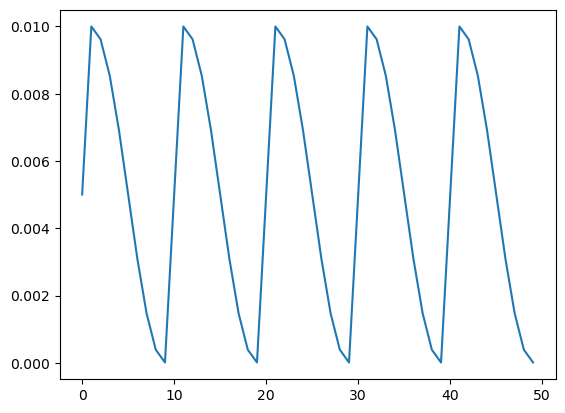

In [25]:
import torch
import matplotlib.pyplot as plt

model = torch.nn.Linear(2, 1)
optimizer = torch.optim.AdamW(model.parameters(), lr=0.00001)
lr_scheduler = CosineAnnealingWarmUpRestarts(optimizer, first_cycle_steps=10, cycle_mult = 1.0, max_lr = 0.01, min_lr = 0.00001, warmup_steps = 2, gamma = 1.0, last_epoch = -1)


lrs = []

for i in range(num_epochs):
    lr_scheduler.step()
    lrs.append(optimizer.param_groups[0]["lr"])

plt.plot(lrs)

In [ ]:
# Case 2: Cosine Annealing with warm up start 사용
torch.manual_seed(7777)

criterion = nn.CrossEntropyLoss().to(device)
optimizer = torch.optim.AdamW(mobilenetv2_transfer.parameters(), lr=0.00001)
scheduler = CosineAnnealingWarmUpRestarts(optimizer, first_cycle_steps=10, cycle_mult = 1.0, max_lr = 0.01, min_lr = 0.00001, warmup_steps = 2, gamma = 1.0, last_epoch = -1)

val_every = 1
saved_dir = './saved'

### [Train]

In [ ]:
train(num_epochs, mobilenetv2_transfer, train_loader, criterion, optimizer, scheduler, val_every, device, saved_dir, writer)

Start training..


epoch:   0%|          | 0/50 [00:00<?, ?it/s]

in epoch: 0it [00:00, ?it/s]

Epoch [1/50], Step [30/653], Loss: 1.2414, Accuracy: 49.22%
Epoch [1/50], Step [60/653], Loss: 1.1927, Accuracy: 57.81%
Epoch [1/50], Step [90/653], Loss: 1.0104, Accuracy: 67.19%
Epoch [1/50], Step [120/653], Loss: 1.0120, Accuracy: 60.94%
Epoch [1/50], Step [150/653], Loss: 0.8061, Accuracy: 69.53%
Epoch [1/50], Step [180/653], Loss: 0.7634, Accuracy: 70.31%
Epoch [1/50], Step [210/653], Loss: 0.6970, Accuracy: 74.22%
Epoch [1/50], Step [240/653], Loss: 0.6437, Accuracy: 76.56%
Epoch [1/50], Step [270/653], Loss: 0.5742, Accuracy: 77.34%
Epoch [1/50], Step [300/653], Loss: 0.5864, Accuracy: 77.34%
Epoch [1/50], Step [330/653], Loss: 0.6071, Accuracy: 74.22%
Epoch [1/50], Step [360/653], Loss: 0.6345, Accuracy: 78.91%
Epoch [1/50], Step [390/653], Loss: 0.5940, Accuracy: 78.12%
Epoch [1/50], Step [420/653], Loss: 0.4332, Accuracy: 84.38%
Epoch [1/50], Step [450/653], Loss: 0.6538, Accuracy: 75.78%
Epoch [1/50], Step [480/653], Loss: 0.4085, Accuracy: 85.16%
Epoch [1/50], Step [510/653

in epoch: 0it [00:00, ?it/s]

Epoch [2/50], Step [30/653], Loss: 0.6653, Accuracy: 82.81%
Epoch [2/50], Step [60/653], Loss: 0.2846, Accuracy: 89.84%
Epoch [2/50], Step [90/653], Loss: 0.3266, Accuracy: 85.94%
Epoch [2/50], Step [120/653], Loss: 0.1980, Accuracy: 92.97%
Epoch [2/50], Step [150/653], Loss: 0.2329, Accuracy: 92.97%
Epoch [2/50], Step [180/653], Loss: 0.2085, Accuracy: 92.19%
Epoch [2/50], Step [210/653], Loss: 0.1806, Accuracy: 93.75%
Epoch [2/50], Step [240/653], Loss: 0.2135, Accuracy: 94.53%
Epoch [2/50], Step [270/653], Loss: 0.1736, Accuracy: 93.75%
Epoch [2/50], Step [300/653], Loss: 0.1880, Accuracy: 95.31%
Epoch [2/50], Step [330/653], Loss: 0.1719, Accuracy: 92.19%
Epoch [2/50], Step [360/653], Loss: 0.2517, Accuracy: 92.19%
Epoch [2/50], Step [390/653], Loss: 0.1852, Accuracy: 92.19%
Epoch [2/50], Step [420/653], Loss: 0.1990, Accuracy: 96.09%
Epoch [2/50], Step [450/653], Loss: 0.2492, Accuracy: 92.97%
Epoch [2/50], Step [480/653], Loss: 0.3854, Accuracy: 88.28%
Epoch [2/50], Step [510/653

in epoch: 0it [00:00, ?it/s]

Epoch [3/50], Step [30/653], Loss: 0.1491, Accuracy: 94.53%
Epoch [3/50], Step [60/653], Loss: 0.1877, Accuracy: 91.41%
Epoch [3/50], Step [90/653], Loss: 0.2768, Accuracy: 91.41%
Epoch [3/50], Step [120/653], Loss: 0.2194, Accuracy: 91.41%
Epoch [3/50], Step [150/653], Loss: 0.4388, Accuracy: 87.50%
Epoch [3/50], Step [180/653], Loss: 0.2673, Accuracy: 93.75%
Epoch [3/50], Step [210/653], Loss: 0.1688, Accuracy: 93.75%
Epoch [3/50], Step [240/653], Loss: 0.1239, Accuracy: 96.09%
Epoch [3/50], Step [270/653], Loss: 0.1390, Accuracy: 94.53%
Epoch [3/50], Step [300/653], Loss: 0.1701, Accuracy: 92.19%
Epoch [3/50], Step [330/653], Loss: 0.1231, Accuracy: 96.09%
Epoch [3/50], Step [360/653], Loss: 0.2709, Accuracy: 88.28%
Epoch [3/50], Step [390/653], Loss: 0.2717, Accuracy: 92.97%
Epoch [3/50], Step [420/653], Loss: 0.2470, Accuracy: 92.97%
Epoch [3/50], Step [450/653], Loss: 0.2276, Accuracy: 92.97%
Epoch [3/50], Step [480/653], Loss: 0.1683, Accuracy: 93.75%
Epoch [3/50], Step [510/653

in epoch: 0it [00:00, ?it/s]

Epoch [4/50], Step [30/653], Loss: 0.1555, Accuracy: 95.31%
Epoch [4/50], Step [60/653], Loss: 0.1101, Accuracy: 97.66%
Epoch [4/50], Step [90/653], Loss: 0.1607, Accuracy: 93.75%
Epoch [4/50], Step [120/653], Loss: 0.1547, Accuracy: 94.53%
Epoch [4/50], Step [150/653], Loss: 0.2220, Accuracy: 92.97%
Epoch [4/50], Step [180/653], Loss: 0.1310, Accuracy: 93.75%
Epoch [4/50], Step [210/653], Loss: 0.0941, Accuracy: 96.09%
Epoch [4/50], Step [240/653], Loss: 0.1376, Accuracy: 95.31%
Epoch [4/50], Step [270/653], Loss: 0.2695, Accuracy: 92.19%
Epoch [4/50], Step [300/653], Loss: 0.0824, Accuracy: 98.44%
Epoch [4/50], Step [330/653], Loss: 0.1648, Accuracy: 96.88%
Epoch [4/50], Step [360/653], Loss: 0.0645, Accuracy: 99.22%
Epoch [4/50], Step [390/653], Loss: 0.1034, Accuracy: 96.09%
Epoch [4/50], Step [420/653], Loss: 0.2200, Accuracy: 91.41%
Epoch [4/50], Step [450/653], Loss: 0.1524, Accuracy: 93.75%
Epoch [4/50], Step [480/653], Loss: 0.1552, Accuracy: 94.53%
Epoch [4/50], Step [510/653

in epoch: 0it [00:00, ?it/s]

Epoch [5/50], Step [30/653], Loss: 0.1193, Accuracy: 96.88%
Epoch [5/50], Step [60/653], Loss: 0.1399, Accuracy: 95.31%
Epoch [5/50], Step [90/653], Loss: 0.1785, Accuracy: 91.41%
Epoch [5/50], Step [120/653], Loss: 0.1441, Accuracy: 93.75%
Epoch [5/50], Step [150/653], Loss: 0.1619, Accuracy: 94.53%
Epoch [5/50], Step [180/653], Loss: 0.1301, Accuracy: 94.53%
Epoch [5/50], Step [210/653], Loss: 0.1671, Accuracy: 93.75%
Epoch [5/50], Step [240/653], Loss: 0.2321, Accuracy: 90.62%
Epoch [5/50], Step [270/653], Loss: 0.2694, Accuracy: 90.62%
Epoch [5/50], Step [300/653], Loss: 0.1786, Accuracy: 91.41%
Epoch [5/50], Step [330/653], Loss: 0.0931, Accuracy: 97.66%
Epoch [5/50], Step [360/653], Loss: 0.0756, Accuracy: 97.66%
Epoch [5/50], Step [390/653], Loss: 0.2649, Accuracy: 90.62%
Epoch [5/50], Step [420/653], Loss: 0.1734, Accuracy: 92.97%
Epoch [5/50], Step [450/653], Loss: 0.1234, Accuracy: 96.09%
Epoch [5/50], Step [480/653], Loss: 0.1860, Accuracy: 93.75%
Epoch [5/50], Step [510/653

in epoch: 0it [00:00, ?it/s]

Epoch [6/50], Step [30/653], Loss: 0.1654, Accuracy: 93.75%
Epoch [6/50], Step [60/653], Loss: 0.0718, Accuracy: 98.44%
Epoch [6/50], Step [90/653], Loss: 0.1013, Accuracy: 96.88%
Epoch [6/50], Step [120/653], Loss: 0.1035, Accuracy: 96.88%
Epoch [6/50], Step [150/653], Loss: 0.1072, Accuracy: 96.88%
Epoch [6/50], Step [180/653], Loss: 0.2422, Accuracy: 94.53%
Epoch [6/50], Step [210/653], Loss: 0.0969, Accuracy: 96.88%
Epoch [6/50], Step [240/653], Loss: 0.0775, Accuracy: 96.09%
Epoch [6/50], Step [270/653], Loss: 0.1651, Accuracy: 93.75%
Epoch [6/50], Step [300/653], Loss: 0.1632, Accuracy: 93.75%
Epoch [6/50], Step [330/653], Loss: 0.2181, Accuracy: 97.66%
Epoch [6/50], Step [360/653], Loss: 0.2371, Accuracy: 92.97%
Epoch [6/50], Step [390/653], Loss: 0.1334, Accuracy: 96.09%
Epoch [6/50], Step [420/653], Loss: 0.0890, Accuracy: 97.66%
Epoch [6/50], Step [450/653], Loss: 0.2007, Accuracy: 92.97%
Epoch [6/50], Step [480/653], Loss: 0.1109, Accuracy: 96.88%
Epoch [6/50], Step [510/653

in epoch: 0it [00:00, ?it/s]

Epoch [7/50], Step [30/653], Loss: 0.1642, Accuracy: 96.09%
Epoch [7/50], Step [60/653], Loss: 0.1569, Accuracy: 92.19%
Epoch [7/50], Step [90/653], Loss: 0.1968, Accuracy: 94.53%
Epoch [7/50], Step [120/653], Loss: 0.1445, Accuracy: 91.41%
Epoch [7/50], Step [150/653], Loss: 0.0882, Accuracy: 95.31%
Epoch [7/50], Step [180/653], Loss: 0.0775, Accuracy: 96.88%
Epoch [7/50], Step [210/653], Loss: 0.1281, Accuracy: 95.31%
Epoch [7/50], Step [240/653], Loss: 0.2633, Accuracy: 92.19%
Epoch [7/50], Step [270/653], Loss: 0.2294, Accuracy: 92.19%
Epoch [7/50], Step [300/653], Loss: 0.1186, Accuracy: 96.88%
Epoch [7/50], Step [330/653], Loss: 0.2989, Accuracy: 91.41%
Epoch [7/50], Step [360/653], Loss: 0.0644, Accuracy: 98.44%
Epoch [7/50], Step [390/653], Loss: 0.1667, Accuracy: 94.53%
Epoch [7/50], Step [420/653], Loss: 0.1638, Accuracy: 94.53%
Epoch [7/50], Step [450/653], Loss: 0.1528, Accuracy: 93.75%
Epoch [7/50], Step [480/653], Loss: 0.2094, Accuracy: 93.75%
Epoch [7/50], Step [510/653

in epoch: 0it [00:00, ?it/s]

Epoch [8/50], Step [30/653], Loss: 0.1461, Accuracy: 95.31%
Epoch [8/50], Step [60/653], Loss: 0.0551, Accuracy: 98.44%
Epoch [8/50], Step [90/653], Loss: 0.1094, Accuracy: 96.09%
Epoch [8/50], Step [120/653], Loss: 0.1202, Accuracy: 96.88%
Epoch [8/50], Step [150/653], Loss: 0.1148, Accuracy: 96.09%
Epoch [8/50], Step [180/653], Loss: 0.0736, Accuracy: 96.88%
Epoch [8/50], Step [210/653], Loss: 0.0851, Accuracy: 97.66%
Epoch [8/50], Step [240/653], Loss: 0.0525, Accuracy: 99.22%
Epoch [8/50], Step [270/653], Loss: 0.1035, Accuracy: 96.88%
Epoch [8/50], Step [300/653], Loss: 0.0895, Accuracy: 96.88%
Epoch [8/50], Step [330/653], Loss: 0.1209, Accuracy: 94.53%
Epoch [8/50], Step [360/653], Loss: 0.1233, Accuracy: 96.88%
Epoch [8/50], Step [390/653], Loss: 0.0986, Accuracy: 96.09%
Epoch [8/50], Step [420/653], Loss: 0.0968, Accuracy: 94.53%
Epoch [8/50], Step [450/653], Loss: 0.1837, Accuracy: 95.31%
Epoch [8/50], Step [480/653], Loss: 0.1391, Accuracy: 95.31%
Epoch [8/50], Step [510/653

in epoch: 0it [00:00, ?it/s]

Epoch [9/50], Step [30/653], Loss: 0.0815, Accuracy: 95.31%
Epoch [9/50], Step [60/653], Loss: 0.2252, Accuracy: 93.75%
Epoch [9/50], Step [90/653], Loss: 0.1110, Accuracy: 96.09%
Epoch [9/50], Step [120/653], Loss: 0.0852, Accuracy: 96.09%
Epoch [9/50], Step [150/653], Loss: 0.0917, Accuracy: 97.66%
Epoch [9/50], Step [180/653], Loss: 0.0854, Accuracy: 96.09%
Epoch [9/50], Step [210/653], Loss: 0.0308, Accuracy: 99.22%
Epoch [9/50], Step [240/653], Loss: 0.1473, Accuracy: 95.31%
Epoch [9/50], Step [270/653], Loss: 0.0500, Accuracy: 100.00%
Epoch [9/50], Step [300/653], Loss: 0.0826, Accuracy: 96.09%
Epoch [9/50], Step [330/653], Loss: 0.1500, Accuracy: 96.09%
Epoch [9/50], Step [360/653], Loss: 0.1386, Accuracy: 95.31%
Epoch [9/50], Step [390/653], Loss: 0.1008, Accuracy: 95.31%
Epoch [9/50], Step [420/653], Loss: 0.1078, Accuracy: 97.66%
Epoch [9/50], Step [450/653], Loss: 0.0960, Accuracy: 97.66%
Epoch [9/50], Step [480/653], Loss: 0.1694, Accuracy: 95.31%
Epoch [9/50], Step [510/65

in epoch: 0it [00:00, ?it/s]

Epoch [10/50], Step [30/653], Loss: 0.0750, Accuracy: 98.44%
Epoch [10/50], Step [60/653], Loss: 0.1192, Accuracy: 96.88%
Epoch [10/50], Step [90/653], Loss: 0.1326, Accuracy: 96.88%
Epoch [10/50], Step [120/653], Loss: 0.0997, Accuracy: 96.09%
Epoch [10/50], Step [150/653], Loss: 0.1967, Accuracy: 96.09%
Epoch [10/50], Step [180/653], Loss: 0.0781, Accuracy: 96.09%
Epoch [10/50], Step [210/653], Loss: 0.0736, Accuracy: 96.88%
Epoch [10/50], Step [240/653], Loss: 0.1380, Accuracy: 94.53%
Epoch [10/50], Step [270/653], Loss: 0.0570, Accuracy: 96.88%
Epoch [10/50], Step [300/653], Loss: 0.0424, Accuracy: 97.66%
Epoch [10/50], Step [330/653], Loss: 0.1721, Accuracy: 95.31%
Epoch [10/50], Step [360/653], Loss: 0.0863, Accuracy: 95.31%
Epoch [10/50], Step [390/653], Loss: 0.1074, Accuracy: 95.31%
Epoch [10/50], Step [420/653], Loss: 0.1095, Accuracy: 94.53%
Epoch [10/50], Step [450/653], Loss: 0.1208, Accuracy: 95.31%
Epoch [10/50], Step [480/653], Loss: 0.1812, Accuracy: 94.53%
Epoch [10/5

in epoch: 0it [00:00, ?it/s]

Epoch [11/50], Step [30/653], Loss: 0.0865, Accuracy: 94.53%
Epoch [11/50], Step [60/653], Loss: 0.0832, Accuracy: 96.88%
Epoch [11/50], Step [90/653], Loss: 0.0443, Accuracy: 98.44%
Epoch [11/50], Step [120/653], Loss: 0.0418, Accuracy: 98.44%
Epoch [11/50], Step [150/653], Loss: 0.1572, Accuracy: 94.53%
Epoch [11/50], Step [180/653], Loss: 0.0881, Accuracy: 96.88%
Epoch [11/50], Step [210/653], Loss: 0.0809, Accuracy: 98.44%
Epoch [11/50], Step [240/653], Loss: 0.1038, Accuracy: 96.09%
Epoch [11/50], Step [270/653], Loss: 0.0668, Accuracy: 96.88%
Epoch [11/50], Step [300/653], Loss: 0.1015, Accuracy: 96.09%
Epoch [11/50], Step [330/653], Loss: 0.0763, Accuracy: 97.66%
Epoch [11/50], Step [360/653], Loss: 0.1018, Accuracy: 96.88%
Epoch [11/50], Step [390/653], Loss: 0.0577, Accuracy: 98.44%
Epoch [11/50], Step [420/653], Loss: 0.1004, Accuracy: 94.53%
Epoch [11/50], Step [450/653], Loss: 0.2120, Accuracy: 94.53%
Epoch [11/50], Step [480/653], Loss: 0.0604, Accuracy: 98.44%
Epoch [11/5

in epoch: 0it [00:00, ?it/s]

Epoch [12/50], Step [30/653], Loss: 0.1400, Accuracy: 93.75%
Epoch [12/50], Step [60/653], Loss: 0.1529, Accuracy: 92.97%
Epoch [12/50], Step [90/653], Loss: 0.1247, Accuracy: 96.88%
Epoch [12/50], Step [120/653], Loss: 0.1066, Accuracy: 97.66%
Epoch [12/50], Step [150/653], Loss: 0.1771, Accuracy: 94.53%
Epoch [12/50], Step [180/653], Loss: 0.1119, Accuracy: 93.75%
Epoch [12/50], Step [210/653], Loss: 0.1318, Accuracy: 95.31%
Epoch [12/50], Step [240/653], Loss: 0.0646, Accuracy: 98.44%
Epoch [12/50], Step [270/653], Loss: 0.1752, Accuracy: 95.31%
Epoch [12/50], Step [300/653], Loss: 0.0880, Accuracy: 96.09%
Epoch [12/50], Step [330/653], Loss: 0.1987, Accuracy: 93.75%
Epoch [12/50], Step [360/653], Loss: 0.1489, Accuracy: 95.31%
Epoch [12/50], Step [390/653], Loss: 0.1984, Accuracy: 91.41%
Epoch [12/50], Step [420/653], Loss: 0.1164, Accuracy: 94.53%
Epoch [12/50], Step [450/653], Loss: 0.0817, Accuracy: 97.66%
Epoch [12/50], Step [480/653], Loss: 0.1008, Accuracy: 94.53%
Epoch [12/5

in epoch: 0it [00:00, ?it/s]

Epoch [13/50], Step [30/653], Loss: 0.1522, Accuracy: 95.31%
Epoch [13/50], Step [60/653], Loss: 0.1424, Accuracy: 95.31%
Epoch [13/50], Step [90/653], Loss: 0.3208, Accuracy: 93.75%
Epoch [13/50], Step [120/653], Loss: 0.1497, Accuracy: 95.31%
Epoch [13/50], Step [150/653], Loss: 0.1961, Accuracy: 94.53%
Epoch [13/50], Step [180/653], Loss: 0.1897, Accuracy: 92.97%
Epoch [13/50], Step [210/653], Loss: 0.1247, Accuracy: 94.53%
Epoch [13/50], Step [240/653], Loss: 0.1345, Accuracy: 95.31%
Epoch [13/50], Step [270/653], Loss: 0.1733, Accuracy: 96.88%
Epoch [13/50], Step [300/653], Loss: 0.0748, Accuracy: 96.88%
Epoch [13/50], Step [330/653], Loss: 0.2168, Accuracy: 91.41%
Epoch [13/50], Step [360/653], Loss: 0.1709, Accuracy: 96.09%
Epoch [13/50], Step [390/653], Loss: 0.1399, Accuracy: 96.09%
Epoch [13/50], Step [420/653], Loss: 0.1091, Accuracy: 96.09%
Epoch [13/50], Step [450/653], Loss: 0.2189, Accuracy: 93.75%
Epoch [13/50], Step [480/653], Loss: 0.2956, Accuracy: 90.62%
Epoch [13/5

in epoch: 0it [00:00, ?it/s]

Epoch [14/50], Step [30/653], Loss: 0.1164, Accuracy: 94.53%
Epoch [14/50], Step [60/653], Loss: 0.1385, Accuracy: 95.31%
Epoch [14/50], Step [90/653], Loss: 0.0649, Accuracy: 97.66%
Epoch [14/50], Step [120/653], Loss: 0.1165, Accuracy: 96.09%
Epoch [14/50], Step [150/653], Loss: 0.1635, Accuracy: 93.75%
Epoch [14/50], Step [180/653], Loss: 0.1649, Accuracy: 93.75%
Epoch [14/50], Step [210/653], Loss: 0.1385, Accuracy: 93.75%
Epoch [14/50], Step [240/653], Loss: 0.1904, Accuracy: 93.75%
Epoch [14/50], Step [270/653], Loss: 0.1738, Accuracy: 92.97%
Epoch [14/50], Step [300/653], Loss: 0.1466, Accuracy: 94.53%
Epoch [14/50], Step [330/653], Loss: 0.0899, Accuracy: 96.88%
Epoch [14/50], Step [360/653], Loss: 0.1608, Accuracy: 94.53%
Epoch [14/50], Step [390/653], Loss: 0.1317, Accuracy: 93.75%
Epoch [14/50], Step [420/653], Loss: 0.1453, Accuracy: 96.88%
Epoch [14/50], Step [450/653], Loss: 0.3144, Accuracy: 92.19%
Epoch [14/50], Step [480/653], Loss: 0.1347, Accuracy: 96.09%
Epoch [14/5

in epoch: 0it [00:00, ?it/s]

Epoch [15/50], Step [30/653], Loss: 0.1593, Accuracy: 93.75%
Epoch [15/50], Step [60/653], Loss: 0.0693, Accuracy: 97.66%
Epoch [15/50], Step [90/653], Loss: 0.1355, Accuracy: 96.88%
Epoch [15/50], Step [120/653], Loss: 0.1017, Accuracy: 96.88%
Epoch [15/50], Step [150/653], Loss: 0.1783, Accuracy: 94.53%
Epoch [15/50], Step [180/653], Loss: 0.0526, Accuracy: 97.66%
Epoch [15/50], Step [210/653], Loss: 0.1985, Accuracy: 91.41%
Epoch [15/50], Step [240/653], Loss: 0.0935, Accuracy: 96.09%
Epoch [15/50], Step [270/653], Loss: 0.0945, Accuracy: 96.88%
Epoch [15/50], Step [300/653], Loss: 0.0883, Accuracy: 96.09%
Epoch [15/50], Step [330/653], Loss: 0.1518, Accuracy: 93.75%
Epoch [15/50], Step [360/653], Loss: 0.0998, Accuracy: 96.88%
Epoch [15/50], Step [390/653], Loss: 0.0941, Accuracy: 96.88%
Epoch [15/50], Step [420/653], Loss: 0.1505, Accuracy: 96.09%
Epoch [15/50], Step [450/653], Loss: 0.1426, Accuracy: 95.31%
Epoch [15/50], Step [480/653], Loss: 0.1220, Accuracy: 95.31%
Epoch [15/5

in epoch: 0it [00:00, ?it/s]

Epoch [16/50], Step [30/653], Loss: 0.1656, Accuracy: 99.22%
Epoch [16/50], Step [60/653], Loss: 0.1290, Accuracy: 96.88%
Epoch [16/50], Step [90/653], Loss: 0.1515, Accuracy: 95.31%
Epoch [16/50], Step [120/653], Loss: 0.1083, Accuracy: 95.31%
Epoch [16/50], Step [150/653], Loss: 0.0692, Accuracy: 98.44%
Epoch [16/50], Step [180/653], Loss: 0.0705, Accuracy: 98.44%
Epoch [16/50], Step [210/653], Loss: 0.0501, Accuracy: 98.44%
Epoch [16/50], Step [240/653], Loss: 0.1700, Accuracy: 94.53%
Epoch [16/50], Step [270/653], Loss: 0.1590, Accuracy: 96.09%
Epoch [16/50], Step [300/653], Loss: 0.1068, Accuracy: 96.88%
Epoch [16/50], Step [330/653], Loss: 0.2122, Accuracy: 94.53%
Epoch [16/50], Step [360/653], Loss: 0.0775, Accuracy: 96.88%
Epoch [16/50], Step [390/653], Loss: 0.0995, Accuracy: 96.09%
Epoch [16/50], Step [420/653], Loss: 0.1168, Accuracy: 96.09%
Epoch [16/50], Step [450/653], Loss: 0.1237, Accuracy: 93.75%
Epoch [16/50], Step [480/653], Loss: 0.1075, Accuracy: 93.75%
Epoch [16/5

in epoch: 0it [00:00, ?it/s]

Epoch [17/50], Step [30/653], Loss: 0.1543, Accuracy: 93.75%
Epoch [17/50], Step [60/653], Loss: 0.1541, Accuracy: 92.97%
Epoch [17/50], Step [90/653], Loss: 0.1591, Accuracy: 95.31%
Epoch [17/50], Step [120/653], Loss: 0.2248, Accuracy: 92.19%
Epoch [17/50], Step [150/653], Loss: 0.0816, Accuracy: 96.88%
Epoch [17/50], Step [180/653], Loss: 0.0942, Accuracy: 97.66%
Epoch [17/50], Step [210/653], Loss: 0.1383, Accuracy: 93.75%
Epoch [17/50], Step [240/653], Loss: 0.1683, Accuracy: 93.75%
Epoch [17/50], Step [270/653], Loss: 0.1416, Accuracy: 95.31%
Epoch [17/50], Step [300/653], Loss: 0.1426, Accuracy: 93.75%
Epoch [17/50], Step [330/653], Loss: 0.1390, Accuracy: 95.31%
Epoch [17/50], Step [360/653], Loss: 0.2475, Accuracy: 92.19%
Epoch [17/50], Step [390/653], Loss: 0.1119, Accuracy: 96.09%
Epoch [17/50], Step [420/653], Loss: 0.0970, Accuracy: 95.31%
Epoch [17/50], Step [450/653], Loss: 0.1587, Accuracy: 93.75%
Epoch [17/50], Step [480/653], Loss: 0.1295, Accuracy: 93.75%
Epoch [17/5

in epoch: 0it [00:00, ?it/s]

Epoch [18/50], Step [30/653], Loss: 0.1287, Accuracy: 94.53%
Epoch [18/50], Step [60/653], Loss: 0.1439, Accuracy: 96.09%
Epoch [18/50], Step [90/653], Loss: 0.0690, Accuracy: 96.09%
Epoch [18/50], Step [120/653], Loss: 0.0779, Accuracy: 97.66%
Epoch [18/50], Step [150/653], Loss: 0.1074, Accuracy: 96.09%
Epoch [18/50], Step [180/653], Loss: 0.0774, Accuracy: 96.09%
Epoch [18/50], Step [210/653], Loss: 0.0918, Accuracy: 96.88%
Epoch [18/50], Step [240/653], Loss: 0.0762, Accuracy: 97.66%
Epoch [18/50], Step [270/653], Loss: 0.1606, Accuracy: 95.31%
Epoch [18/50], Step [300/653], Loss: 0.0485, Accuracy: 99.22%
Epoch [18/50], Step [330/653], Loss: 0.1168, Accuracy: 96.09%
Epoch [18/50], Step [360/653], Loss: 0.0463, Accuracy: 99.22%
Epoch [18/50], Step [390/653], Loss: 0.0921, Accuracy: 96.88%
Epoch [18/50], Step [420/653], Loss: 0.1020, Accuracy: 96.88%
Epoch [18/50], Step [450/653], Loss: 0.1626, Accuracy: 93.75%
Epoch [18/50], Step [480/653], Loss: 0.1002, Accuracy: 96.88%
Epoch [18/5

in epoch: 0it [00:00, ?it/s]

Epoch [19/50], Step [30/653], Loss: 0.0955, Accuracy: 95.31%
Epoch [19/50], Step [60/653], Loss: 0.0671, Accuracy: 96.88%
Epoch [19/50], Step [90/653], Loss: 0.1199, Accuracy: 96.09%
Epoch [19/50], Step [120/653], Loss: 0.1460, Accuracy: 95.31%
Epoch [19/50], Step [150/653], Loss: 0.0844, Accuracy: 96.88%
Epoch [19/50], Step [180/653], Loss: 0.0168, Accuracy: 100.00%
Epoch [19/50], Step [210/653], Loss: 0.0910, Accuracy: 97.66%
Epoch [19/50], Step [240/653], Loss: 0.1935, Accuracy: 94.53%
Epoch [19/50], Step [270/653], Loss: 0.0344, Accuracy: 97.66%
Epoch [19/50], Step [300/653], Loss: 0.0826, Accuracy: 96.88%
Epoch [19/50], Step [330/653], Loss: 0.0918, Accuracy: 97.66%
Epoch [19/50], Step [360/653], Loss: 0.0384, Accuracy: 97.66%
Epoch [19/50], Step [390/653], Loss: 0.0615, Accuracy: 96.88%
Epoch [19/50], Step [420/653], Loss: 0.0686, Accuracy: 98.44%
Epoch [19/50], Step [450/653], Loss: 0.1426, Accuracy: 96.09%
Epoch [19/50], Step [480/653], Loss: 0.0764, Accuracy: 97.66%
Epoch [19/

in epoch: 0it [00:00, ?it/s]

Epoch [20/50], Step [30/653], Loss: 0.1110, Accuracy: 97.66%
Epoch [20/50], Step [60/653], Loss: 0.1091, Accuracy: 97.66%
Epoch [20/50], Step [90/653], Loss: 0.0948, Accuracy: 96.09%
Epoch [20/50], Step [120/653], Loss: 0.1066, Accuracy: 94.53%
Epoch [20/50], Step [150/653], Loss: 0.1321, Accuracy: 95.31%
Epoch [20/50], Step [180/653], Loss: 0.1114, Accuracy: 96.88%
Epoch [20/50], Step [210/653], Loss: 0.1288, Accuracy: 95.31%
Epoch [20/50], Step [240/653], Loss: 0.0859, Accuracy: 96.88%
Epoch [20/50], Step [270/653], Loss: 0.0719, Accuracy: 98.44%
Epoch [20/50], Step [300/653], Loss: 0.1019, Accuracy: 94.53%
Epoch [20/50], Step [330/653], Loss: 0.0822, Accuracy: 97.66%
Epoch [20/50], Step [360/653], Loss: 0.0774, Accuracy: 96.88%
Epoch [20/50], Step [390/653], Loss: 0.0694, Accuracy: 96.88%
Epoch [20/50], Step [420/653], Loss: 0.0351, Accuracy: 99.22%
Epoch [20/50], Step [450/653], Loss: 0.1160, Accuracy: 97.66%
Epoch [20/50], Step [480/653], Loss: 0.0799, Accuracy: 96.09%
Epoch [20/5

in epoch: 0it [00:00, ?it/s]

Epoch [21/50], Step [30/653], Loss: 0.0748, Accuracy: 98.44%
Epoch [21/50], Step [60/653], Loss: 0.0865, Accuracy: 96.09%
Epoch [21/50], Step [90/653], Loss: 0.1244, Accuracy: 96.09%
Epoch [21/50], Step [120/653], Loss: 0.0810, Accuracy: 96.09%
Epoch [21/50], Step [150/653], Loss: 0.1390, Accuracy: 94.53%
Epoch [21/50], Step [180/653], Loss: 0.0703, Accuracy: 97.66%
Epoch [21/50], Step [210/653], Loss: 0.0979, Accuracy: 96.88%
Epoch [21/50], Step [240/653], Loss: 0.1267, Accuracy: 96.09%
Epoch [21/50], Step [270/653], Loss: 0.1606, Accuracy: 96.09%
Epoch [21/50], Step [300/653], Loss: 0.1102, Accuracy: 96.88%
Epoch [21/50], Step [330/653], Loss: 0.1099, Accuracy: 96.09%
Epoch [21/50], Step [360/653], Loss: 0.1542, Accuracy: 92.97%
Epoch [21/50], Step [390/653], Loss: 0.0596, Accuracy: 99.22%
Epoch [21/50], Step [420/653], Loss: 0.1388, Accuracy: 92.97%
Epoch [21/50], Step [450/653], Loss: 0.1639, Accuracy: 96.09%
Epoch [21/50], Step [480/653], Loss: 0.0758, Accuracy: 97.66%
Epoch [21/5

in epoch: 0it [00:00, ?it/s]

Epoch [22/50], Step [30/653], Loss: 0.0923, Accuracy: 95.31%
Epoch [22/50], Step [60/653], Loss: 0.1785, Accuracy: 93.75%
Epoch [22/50], Step [90/653], Loss: 0.1000, Accuracy: 96.88%
Epoch [22/50], Step [120/653], Loss: 0.1107, Accuracy: 95.31%
Epoch [22/50], Step [150/653], Loss: 0.1258, Accuracy: 94.53%
Epoch [22/50], Step [180/653], Loss: 0.1288, Accuracy: 93.75%
Epoch [22/50], Step [210/653], Loss: 0.1242, Accuracy: 97.66%
Epoch [22/50], Step [240/653], Loss: 0.0514, Accuracy: 98.44%
Epoch [22/50], Step [270/653], Loss: 0.1005, Accuracy: 96.88%
Epoch [22/50], Step [300/653], Loss: 0.0821, Accuracy: 96.09%
Epoch [22/50], Step [330/653], Loss: 0.1513, Accuracy: 95.31%
Epoch [22/50], Step [360/653], Loss: 0.2135, Accuracy: 90.62%
Epoch [22/50], Step [390/653], Loss: 0.1576, Accuracy: 96.09%
Epoch [22/50], Step [420/653], Loss: 0.2025, Accuracy: 91.41%
Epoch [22/50], Step [450/653], Loss: 0.0863, Accuracy: 97.66%
Epoch [22/50], Step [480/653], Loss: 0.1391, Accuracy: 92.97%
Epoch [22/5

in epoch: 0it [00:00, ?it/s]

Epoch [23/50], Step [30/653], Loss: 0.1251, Accuracy: 95.31%
Epoch [23/50], Step [60/653], Loss: 0.0955, Accuracy: 97.66%
Epoch [23/50], Step [90/653], Loss: 0.0699, Accuracy: 96.88%
Epoch [23/50], Step [120/653], Loss: 0.1080, Accuracy: 96.09%
Epoch [23/50], Step [150/653], Loss: 0.2118, Accuracy: 93.75%
Epoch [23/50], Step [180/653], Loss: 0.1681, Accuracy: 96.09%
Epoch [23/50], Step [210/653], Loss: 0.1447, Accuracy: 92.97%
Epoch [23/50], Step [240/653], Loss: 0.0980, Accuracy: 96.09%
Epoch [23/50], Step [270/653], Loss: 0.1468, Accuracy: 96.88%
Epoch [23/50], Step [300/653], Loss: 0.1620, Accuracy: 92.97%
Epoch [23/50], Step [330/653], Loss: 0.1421, Accuracy: 92.97%
Epoch [23/50], Step [360/653], Loss: 0.1200, Accuracy: 96.88%
Epoch [23/50], Step [390/653], Loss: 0.2466, Accuracy: 92.19%
Epoch [23/50], Step [420/653], Loss: 0.0990, Accuracy: 96.88%
Epoch [23/50], Step [450/653], Loss: 0.0984, Accuracy: 96.88%
Epoch [23/50], Step [480/653], Loss: 0.1314, Accuracy: 93.75%
Epoch [23/5

in epoch: 0it [00:00, ?it/s]

Epoch [24/50], Step [30/653], Loss: 0.1016, Accuracy: 95.31%
Epoch [24/50], Step [60/653], Loss: 0.1602, Accuracy: 93.75%
Epoch [24/50], Step [90/653], Loss: 0.1035, Accuracy: 94.53%
Epoch [24/50], Step [120/653], Loss: 0.0351, Accuracy: 99.22%
Epoch [24/50], Step [150/653], Loss: 0.0712, Accuracy: 96.88%
Epoch [24/50], Step [180/653], Loss: 0.0760, Accuracy: 96.09%
Epoch [24/50], Step [210/653], Loss: 0.0915, Accuracy: 97.66%
Epoch [24/50], Step [240/653], Loss: 0.0667, Accuracy: 96.88%
Epoch [24/50], Step [270/653], Loss: 0.1435, Accuracy: 96.09%
Epoch [24/50], Step [300/653], Loss: 0.0697, Accuracy: 96.88%
Epoch [24/50], Step [330/653], Loss: 0.0910, Accuracy: 96.88%
Epoch [24/50], Step [360/653], Loss: 0.0352, Accuracy: 99.22%
Epoch [24/50], Step [390/653], Loss: 0.1412, Accuracy: 96.88%
Epoch [24/50], Step [420/653], Loss: 0.0850, Accuracy: 97.66%
Epoch [24/50], Step [450/653], Loss: 0.1332, Accuracy: 95.31%
Epoch [24/50], Step [480/653], Loss: 0.1030, Accuracy: 96.88%
Epoch [24/5

in epoch: 0it [00:00, ?it/s]

Epoch [25/50], Step [30/653], Loss: 0.0402, Accuracy: 97.66%
Epoch [25/50], Step [60/653], Loss: 0.0782, Accuracy: 96.88%
Epoch [25/50], Step [90/653], Loss: 0.0475, Accuracy: 97.66%
Epoch [25/50], Step [120/653], Loss: 0.1192, Accuracy: 96.88%
Epoch [25/50], Step [150/653], Loss: 0.0790, Accuracy: 96.09%
Epoch [25/50], Step [180/653], Loss: 0.1455, Accuracy: 93.75%
Epoch [25/50], Step [210/653], Loss: 0.0858, Accuracy: 96.88%
Epoch [25/50], Step [240/653], Loss: 0.0952, Accuracy: 95.31%
Epoch [25/50], Step [270/653], Loss: 0.0248, Accuracy: 99.22%
Epoch [25/50], Step [300/653], Loss: 0.0650, Accuracy: 98.44%
Epoch [25/50], Step [330/653], Loss: 0.0907, Accuracy: 96.88%
Epoch [25/50], Step [360/653], Loss: 0.1007, Accuracy: 95.31%
Epoch [25/50], Step [390/653], Loss: 0.0725, Accuracy: 98.44%
Epoch [25/50], Step [420/653], Loss: 0.1102, Accuracy: 95.31%
Epoch [25/50], Step [450/653], Loss: 0.1142, Accuracy: 97.66%
Epoch [25/50], Step [480/653], Loss: 0.0719, Accuracy: 96.88%
Epoch [25/5

in epoch: 0it [00:00, ?it/s]

Epoch [26/50], Step [30/653], Loss: 0.1108, Accuracy: 94.53%
Epoch [26/50], Step [60/653], Loss: 0.1487, Accuracy: 95.31%
Epoch [26/50], Step [90/653], Loss: 0.0747, Accuracy: 96.09%
Epoch [26/50], Step [120/653], Loss: 0.0806, Accuracy: 96.88%
Epoch [26/50], Step [150/653], Loss: 0.1510, Accuracy: 95.31%
Epoch [26/50], Step [180/653], Loss: 0.0664, Accuracy: 97.66%
Epoch [26/50], Step [210/653], Loss: 0.0304, Accuracy: 100.00%
Epoch [26/50], Step [240/653], Loss: 0.0712, Accuracy: 98.44%
Epoch [26/50], Step [270/653], Loss: 0.0979, Accuracy: 96.09%
Epoch [26/50], Step [300/653], Loss: 0.0778, Accuracy: 97.66%
Epoch [26/50], Step [330/653], Loss: 0.0901, Accuracy: 96.88%
Epoch [26/50], Step [360/653], Loss: 0.0643, Accuracy: 97.66%
Epoch [26/50], Step [390/653], Loss: 0.0794, Accuracy: 96.88%
Epoch [26/50], Step [420/653], Loss: 0.1450, Accuracy: 96.09%
Epoch [26/50], Step [450/653], Loss: 0.1097, Accuracy: 94.53%
Epoch [26/50], Step [480/653], Loss: 0.1111, Accuracy: 96.09%
Epoch [26/

in epoch: 0it [00:00, ?it/s]

Epoch [27/50], Step [30/653], Loss: 0.1660, Accuracy: 94.53%
Epoch [27/50], Step [60/653], Loss: 0.1646, Accuracy: 95.31%
Epoch [27/50], Step [90/653], Loss: 0.1295, Accuracy: 94.53%
Epoch [27/50], Step [120/653], Loss: 0.1069, Accuracy: 96.88%
Epoch [27/50], Step [150/653], Loss: 0.1445, Accuracy: 95.31%
Epoch [27/50], Step [180/653], Loss: 0.1348, Accuracy: 96.09%
Epoch [27/50], Step [210/653], Loss: 0.1255, Accuracy: 96.88%
Epoch [27/50], Step [240/653], Loss: 0.1377, Accuracy: 96.09%
Epoch [27/50], Step [270/653], Loss: 0.0741, Accuracy: 97.66%
Epoch [27/50], Step [300/653], Loss: 0.0959, Accuracy: 97.66%
Epoch [27/50], Step [330/653], Loss: 0.1507, Accuracy: 96.09%
Epoch [27/50], Step [360/653], Loss: 0.1561, Accuracy: 94.53%
Epoch [27/50], Step [390/653], Loss: 0.1016, Accuracy: 96.88%
Epoch [27/50], Step [420/653], Loss: 0.1493, Accuracy: 90.62%
Epoch [27/50], Step [450/653], Loss: 0.0665, Accuracy: 97.66%
Epoch [27/50], Step [480/653], Loss: 0.1787, Accuracy: 94.53%
Epoch [27/5

in epoch: 0it [00:00, ?it/s]

Epoch [28/50], Step [30/653], Loss: 0.0872, Accuracy: 98.44%
Epoch [28/50], Step [60/653], Loss: 0.1606, Accuracy: 92.19%
Epoch [28/50], Step [90/653], Loss: 0.1430, Accuracy: 94.53%
Epoch [28/50], Step [120/653], Loss: 0.1230, Accuracy: 96.88%
Epoch [28/50], Step [150/653], Loss: 0.1392, Accuracy: 95.31%
Epoch [28/50], Step [180/653], Loss: 0.0482, Accuracy: 99.22%
Epoch [28/50], Step [210/653], Loss: 0.1007, Accuracy: 96.09%
Epoch [28/50], Step [240/653], Loss: 0.1036, Accuracy: 96.88%
Epoch [28/50], Step [270/653], Loss: 0.1224, Accuracy: 95.31%
Epoch [28/50], Step [300/653], Loss: 0.0853, Accuracy: 98.44%
Epoch [28/50], Step [330/653], Loss: 0.1252, Accuracy: 96.09%
Epoch [28/50], Step [360/653], Loss: 0.1084, Accuracy: 96.09%
Epoch [28/50], Step [390/653], Loss: 0.1072, Accuracy: 94.53%
Epoch [28/50], Step [420/653], Loss: 0.0653, Accuracy: 96.88%
Epoch [28/50], Step [450/653], Loss: 0.1178, Accuracy: 96.09%
Epoch [28/50], Step [480/653], Loss: 0.2195, Accuracy: 92.97%
Epoch [28/5

in epoch: 0it [00:00, ?it/s]

Epoch [29/50], Step [30/653], Loss: 0.0984, Accuracy: 95.31%
Epoch [29/50], Step [60/653], Loss: 0.0849, Accuracy: 98.44%
Epoch [29/50], Step [90/653], Loss: 0.0979, Accuracy: 96.09%
Epoch [29/50], Step [120/653], Loss: 0.1487, Accuracy: 94.53%
Epoch [29/50], Step [150/653], Loss: 0.0588, Accuracy: 98.44%
Epoch [29/50], Step [180/653], Loss: 0.0894, Accuracy: 97.66%
Epoch [29/50], Step [210/653], Loss: 0.1707, Accuracy: 94.53%
Epoch [29/50], Step [240/653], Loss: 0.0910, Accuracy: 96.88%
Epoch [29/50], Step [270/653], Loss: 0.1399, Accuracy: 95.31%
Epoch [29/50], Step [300/653], Loss: 0.1716, Accuracy: 94.53%
Epoch [29/50], Step [330/653], Loss: 0.0639, Accuracy: 97.66%
Epoch [29/50], Step [360/653], Loss: 0.1548, Accuracy: 94.53%
Epoch [29/50], Step [390/653], Loss: 0.1309, Accuracy: 94.53%
Epoch [29/50], Step [420/653], Loss: 0.0672, Accuracy: 99.22%
Epoch [29/50], Step [450/653], Loss: 0.2091, Accuracy: 91.41%
Epoch [29/50], Step [480/653], Loss: 0.0643, Accuracy: 99.22%
Epoch [29/5

in epoch: 0it [00:00, ?it/s]

Epoch [30/50], Step [30/653], Loss: 0.1096, Accuracy: 95.31%
Epoch [30/50], Step [60/653], Loss: 0.1617, Accuracy: 96.09%
Epoch [30/50], Step [90/653], Loss: 0.1419, Accuracy: 96.09%
Epoch [30/50], Step [120/653], Loss: 0.0975, Accuracy: 96.88%
Epoch [30/50], Step [150/653], Loss: 0.0402, Accuracy: 99.22%
Epoch [30/50], Step [180/653], Loss: 0.0803, Accuracy: 97.66%
Epoch [30/50], Step [210/653], Loss: 0.0770, Accuracy: 95.31%
Epoch [30/50], Step [240/653], Loss: 0.1108, Accuracy: 95.31%
Epoch [30/50], Step [270/653], Loss: 0.1108, Accuracy: 94.53%
Epoch [30/50], Step [300/653], Loss: 0.0671, Accuracy: 97.66%
Epoch [30/50], Step [330/653], Loss: 0.0556, Accuracy: 97.66%
Epoch [30/50], Step [360/653], Loss: 0.0376, Accuracy: 99.22%
Epoch [30/50], Step [390/653], Loss: 0.0938, Accuracy: 96.09%
Epoch [30/50], Step [420/653], Loss: 0.0789, Accuracy: 96.88%
Epoch [30/50], Step [450/653], Loss: 0.0828, Accuracy: 96.09%
Epoch [30/50], Step [480/653], Loss: 0.1345, Accuracy: 96.88%
Epoch [30/5

in epoch: 0it [00:00, ?it/s]

Epoch [31/50], Step [30/653], Loss: 0.1281, Accuracy: 95.31%
Epoch [31/50], Step [60/653], Loss: 0.1056, Accuracy: 94.53%
Epoch [31/50], Step [90/653], Loss: 0.1855, Accuracy: 92.97%
Epoch [31/50], Step [120/653], Loss: 0.0539, Accuracy: 98.44%
Epoch [31/50], Step [150/653], Loss: 0.0349, Accuracy: 100.00%
Epoch [31/50], Step [180/653], Loss: 0.0994, Accuracy: 96.88%
Epoch [31/50], Step [210/653], Loss: 0.0672, Accuracy: 96.09%
Epoch [31/50], Step [240/653], Loss: 0.0459, Accuracy: 99.22%
Epoch [31/50], Step [270/653], Loss: 0.1064, Accuracy: 95.31%
Epoch [31/50], Step [300/653], Loss: 0.0294, Accuracy: 100.00%
Epoch [31/50], Step [330/653], Loss: 0.0399, Accuracy: 98.44%
Epoch [31/50], Step [360/653], Loss: 0.1191, Accuracy: 94.53%
Epoch [31/50], Step [390/653], Loss: 0.0489, Accuracy: 98.44%
Epoch [31/50], Step [420/653], Loss: 0.1654, Accuracy: 95.31%
Epoch [31/50], Step [450/653], Loss: 0.0735, Accuracy: 97.66%
Epoch [31/50], Step [480/653], Loss: 0.0626, Accuracy: 96.88%
Epoch [31

in epoch: 0it [00:00, ?it/s]

Epoch [32/50], Step [30/653], Loss: 0.0262, Accuracy: 99.22%
Epoch [32/50], Step [60/653], Loss: 0.1520, Accuracy: 96.88%
Epoch [32/50], Step [90/653], Loss: 0.0317, Accuracy: 99.22%
Epoch [32/50], Step [120/653], Loss: 0.0674, Accuracy: 97.66%
Epoch [32/50], Step [150/653], Loss: 0.0615, Accuracy: 96.88%
Epoch [32/50], Step [180/653], Loss: 0.0675, Accuracy: 96.09%
Epoch [32/50], Step [210/653], Loss: 0.0678, Accuracy: 96.88%
Epoch [32/50], Step [240/653], Loss: 0.0852, Accuracy: 97.66%
Epoch [32/50], Step [270/653], Loss: 0.0850, Accuracy: 97.66%
Epoch [32/50], Step [300/653], Loss: 0.0702, Accuracy: 95.31%
Epoch [32/50], Step [330/653], Loss: 0.1005, Accuracy: 96.09%
Epoch [32/50], Step [360/653], Loss: 0.0687, Accuracy: 96.09%
Epoch [32/50], Step [390/653], Loss: 0.1092, Accuracy: 95.31%
Epoch [32/50], Step [420/653], Loss: 0.1118, Accuracy: 96.09%
Epoch [32/50], Step [450/653], Loss: 0.0569, Accuracy: 97.66%
Epoch [32/50], Step [480/653], Loss: 0.1049, Accuracy: 96.09%
Epoch [32/5

in epoch: 0it [00:00, ?it/s]

Epoch [33/50], Step [30/653], Loss: 0.0816, Accuracy: 96.09%
Epoch [33/50], Step [60/653], Loss: 0.1261, Accuracy: 96.09%
Epoch [33/50], Step [90/653], Loss: 0.0748, Accuracy: 97.66%
Epoch [33/50], Step [120/653], Loss: 0.1173, Accuracy: 97.66%
Epoch [33/50], Step [150/653], Loss: 0.0526, Accuracy: 98.44%
Epoch [33/50], Step [180/653], Loss: 0.0450, Accuracy: 97.66%
Epoch [33/50], Step [210/653], Loss: 0.0761, Accuracy: 97.66%
Epoch [33/50], Step [240/653], Loss: 0.0733, Accuracy: 96.88%
Epoch [33/50], Step [270/653], Loss: 0.0416, Accuracy: 98.44%
Epoch [33/50], Step [300/653], Loss: 0.0624, Accuracy: 95.31%
Epoch [33/50], Step [330/653], Loss: 0.0577, Accuracy: 98.44%
Epoch [33/50], Step [360/653], Loss: 0.0614, Accuracy: 96.88%
Epoch [33/50], Step [390/653], Loss: 0.0285, Accuracy: 100.00%
Epoch [33/50], Step [420/653], Loss: 0.0558, Accuracy: 96.09%
Epoch [33/50], Step [450/653], Loss: 0.0388, Accuracy: 98.44%
Epoch [33/50], Step [480/653], Loss: 0.0786, Accuracy: 96.09%
Epoch [33/

in epoch: 0it [00:00, ?it/s]

Epoch [34/50], Step [30/653], Loss: 0.0742, Accuracy: 96.88%
Epoch [34/50], Step [60/653], Loss: 0.0927, Accuracy: 95.31%
Epoch [34/50], Step [90/653], Loss: 0.0166, Accuracy: 100.00%
Epoch [34/50], Step [120/653], Loss: 0.0724, Accuracy: 97.66%
Epoch [34/50], Step [150/653], Loss: 0.1433, Accuracy: 95.31%
Epoch [34/50], Step [180/653], Loss: 0.1230, Accuracy: 95.31%
Epoch [34/50], Step [210/653], Loss: 0.0898, Accuracy: 96.09%
Epoch [34/50], Step [240/653], Loss: 0.0504, Accuracy: 99.22%
Epoch [34/50], Step [270/653], Loss: 0.1253, Accuracy: 96.09%
Epoch [34/50], Step [300/653], Loss: 0.0817, Accuracy: 98.44%
Epoch [34/50], Step [330/653], Loss: 0.0910, Accuracy: 97.66%
Epoch [34/50], Step [360/653], Loss: 0.0721, Accuracy: 96.88%
Epoch [34/50], Step [390/653], Loss: 0.0512, Accuracy: 99.22%
Epoch [34/50], Step [420/653], Loss: 0.1417, Accuracy: 93.75%
Epoch [34/50], Step [450/653], Loss: 0.1003, Accuracy: 96.09%
Epoch [34/50], Step [480/653], Loss: 0.0657, Accuracy: 98.44%
Epoch [34/

in epoch: 0it [00:00, ?it/s]

Epoch [35/50], Step [30/653], Loss: 0.1484, Accuracy: 95.31%
Epoch [35/50], Step [60/653], Loss: 0.1038, Accuracy: 94.53%
Epoch [35/50], Step [90/653], Loss: 0.1543, Accuracy: 92.97%
Epoch [35/50], Step [120/653], Loss: 0.2122, Accuracy: 92.97%
Epoch [35/50], Step [150/653], Loss: 0.0814, Accuracy: 98.44%
Epoch [35/50], Step [180/653], Loss: 0.2649, Accuracy: 92.97%
Epoch [35/50], Step [210/653], Loss: 0.1344, Accuracy: 96.88%
Epoch [35/50], Step [240/653], Loss: 0.0681, Accuracy: 97.66%
Epoch [35/50], Step [270/653], Loss: 0.1037, Accuracy: 95.31%
Epoch [35/50], Step [300/653], Loss: 0.0596, Accuracy: 97.66%
Epoch [35/50], Step [330/653], Loss: 0.1399, Accuracy: 93.75%
Epoch [35/50], Step [360/653], Loss: 0.2411, Accuracy: 92.97%
Epoch [35/50], Step [390/653], Loss: 0.0803, Accuracy: 96.09%
Epoch [35/50], Step [420/653], Loss: 0.1280, Accuracy: 96.88%
Epoch [35/50], Step [450/653], Loss: 0.1376, Accuracy: 95.31%
Epoch [35/50], Step [480/653], Loss: 0.1612, Accuracy: 94.53%
Epoch [35/5

in epoch: 0it [00:00, ?it/s]

Epoch [36/50], Step [30/653], Loss: 0.1396, Accuracy: 96.09%
Epoch [36/50], Step [60/653], Loss: 0.1160, Accuracy: 96.88%
Epoch [36/50], Step [90/653], Loss: 0.1205, Accuracy: 94.53%
Epoch [36/50], Step [120/653], Loss: 0.0961, Accuracy: 98.44%
Epoch [36/50], Step [150/653], Loss: 0.0526, Accuracy: 99.22%
Epoch [36/50], Step [180/653], Loss: 0.1628, Accuracy: 94.53%
Epoch [36/50], Step [210/653], Loss: 0.0669, Accuracy: 97.66%
Epoch [36/50], Step [240/653], Loss: 0.1197, Accuracy: 95.31%
Epoch [36/50], Step [270/653], Loss: 0.1114, Accuracy: 95.31%
Epoch [36/50], Step [300/653], Loss: 0.1184, Accuracy: 95.31%
Epoch [36/50], Step [330/653], Loss: 0.0784, Accuracy: 96.88%
Epoch [36/50], Step [360/653], Loss: 0.1423, Accuracy: 96.09%
Epoch [36/50], Step [390/653], Loss: 0.1254, Accuracy: 96.09%
Epoch [36/50], Step [420/653], Loss: 0.1337, Accuracy: 97.66%
Epoch [36/50], Step [450/653], Loss: 0.0853, Accuracy: 97.66%
Epoch [36/50], Step [480/653], Loss: 0.1312, Accuracy: 97.66%
Epoch [36/5

in epoch: 0it [00:00, ?it/s]

Epoch [37/50], Step [30/653], Loss: 0.1578, Accuracy: 94.53%
Epoch [37/50], Step [60/653], Loss: 0.0646, Accuracy: 98.44%
Epoch [37/50], Step [90/653], Loss: 0.1223, Accuracy: 96.88%
Epoch [37/50], Step [120/653], Loss: 0.0635, Accuracy: 99.22%
Epoch [37/50], Step [150/653], Loss: 0.1647, Accuracy: 94.53%
Epoch [37/50], Step [180/653], Loss: 0.0787, Accuracy: 97.66%
Epoch [37/50], Step [210/653], Loss: 0.1549, Accuracy: 93.75%
Epoch [37/50], Step [240/653], Loss: 0.0908, Accuracy: 97.66%
Epoch [37/50], Step [270/653], Loss: 0.0786, Accuracy: 98.44%
Epoch [37/50], Step [300/653], Loss: 0.1375, Accuracy: 95.31%
Epoch [37/50], Step [330/653], Loss: 0.0835, Accuracy: 96.09%
Epoch [37/50], Step [360/653], Loss: 0.0837, Accuracy: 96.88%
Epoch [37/50], Step [390/653], Loss: 0.0639, Accuracy: 98.44%
Epoch [37/50], Step [420/653], Loss: 0.0915, Accuracy: 96.09%
Epoch [37/50], Step [450/653], Loss: 0.0763, Accuracy: 96.88%
Epoch [37/50], Step [480/653], Loss: 0.0676, Accuracy: 96.88%
Epoch [37/5

in epoch: 0it [00:00, ?it/s]

Epoch [38/50], Step [30/653], Loss: 0.1117, Accuracy: 96.88%
Epoch [38/50], Step [60/653], Loss: 0.0429, Accuracy: 99.22%
Epoch [38/50], Step [90/653], Loss: 0.1173, Accuracy: 96.09%
Epoch [38/50], Step [120/653], Loss: 0.1034, Accuracy: 95.31%
Epoch [38/50], Step [150/653], Loss: 0.0871, Accuracy: 97.66%
Epoch [38/50], Step [180/653], Loss: 0.1459, Accuracy: 96.88%
Epoch [38/50], Step [210/653], Loss: 0.1512, Accuracy: 94.53%
Epoch [38/50], Step [240/653], Loss: 0.1250, Accuracy: 96.88%
Epoch [38/50], Step [270/653], Loss: 0.0675, Accuracy: 97.66%
Epoch [38/50], Step [300/653], Loss: 0.1204, Accuracy: 95.31%
Epoch [38/50], Step [330/653], Loss: 0.0703, Accuracy: 97.66%
Epoch [38/50], Step [360/653], Loss: 0.0697, Accuracy: 96.88%
Epoch [38/50], Step [390/653], Loss: 0.1119, Accuracy: 96.09%
Epoch [38/50], Step [420/653], Loss: 0.0651, Accuracy: 96.88%
Epoch [38/50], Step [450/653], Loss: 0.0819, Accuracy: 96.88%
Epoch [38/50], Step [480/653], Loss: 0.2466, Accuracy: 93.75%
Epoch [38/5

in epoch: 0it [00:00, ?it/s]

Epoch [39/50], Step [30/653], Loss: 0.0607, Accuracy: 96.09%
Epoch [39/50], Step [60/653], Loss: 0.0645, Accuracy: 96.88%
Epoch [39/50], Step [90/653], Loss: 0.1171, Accuracy: 95.31%
Epoch [39/50], Step [120/653], Loss: 0.0880, Accuracy: 96.88%
Epoch [39/50], Step [150/653], Loss: 0.0615, Accuracy: 98.44%
Epoch [39/50], Step [180/653], Loss: 0.0498, Accuracy: 98.44%
Epoch [39/50], Step [210/653], Loss: 0.1415, Accuracy: 96.09%
Epoch [39/50], Step [240/653], Loss: 0.0734, Accuracy: 96.88%
Epoch [39/50], Step [270/653], Loss: 0.0684, Accuracy: 97.66%
Epoch [39/50], Step [300/653], Loss: 0.0683, Accuracy: 97.66%
Epoch [39/50], Step [330/653], Loss: 0.0571, Accuracy: 99.22%
Epoch [39/50], Step [360/653], Loss: 0.1426, Accuracy: 95.31%
Epoch [39/50], Step [390/653], Loss: 0.0709, Accuracy: 96.09%
Epoch [39/50], Step [420/653], Loss: 0.1654, Accuracy: 92.19%
Epoch [39/50], Step [450/653], Loss: 0.0855, Accuracy: 96.88%
Epoch [39/50], Step [480/653], Loss: 0.1305, Accuracy: 93.75%
Epoch [39/5

in epoch: 0it [00:00, ?it/s]

Epoch [40/50], Step [30/653], Loss: 0.1649, Accuracy: 95.31%
Epoch [40/50], Step [60/653], Loss: 0.0599, Accuracy: 99.22%
Epoch [40/50], Step [90/653], Loss: 0.0504, Accuracy: 98.44%


KeyboardInterrupt: 

##### Visualizing train loss and accuracy

- With Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir='./logs/logs_transfer'

### [Test]

##### Loading best model

In [35]:
mobilenetv2_test = TransferMobileNetV2(num_classes=4).to(device) 
model_path = './saved/ckpoint_34_100.0%.pt'    # .pt 앞에 파일 이름 붙이기
checkpoint = torch.load(model_path, map_location=device)
state_dict = checkpoint['model_state_dict']
print('loss: ', checkpoint['loss'])
mobilenetv2_test.load_state_dict(state_dict)
mobilenetv2_test.eval()

loss:  tensor(0.0171)


TransferMobileNetV2(
  (mobilenet_v2): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, k

##### Actual test

In [38]:
with torch.no_grad():
    pred_list, answer_list, pred_proba_list = test(mobilenetv2_test, test_loader, device)

Start test..


0it [00:00, ?it/s]

Test accuracy for 968 images: 97.83%


##### Confusion Matrix

In [44]:
print(np.unique(pred_list))
print(pred_list.shape)
print(np.unique(answer_list))
print(answer_list.shape)
print(pred_proba_list.shape)

[0 1 2 3]
(968,)
[0 1 2 3]
(968,)
(968, 4)


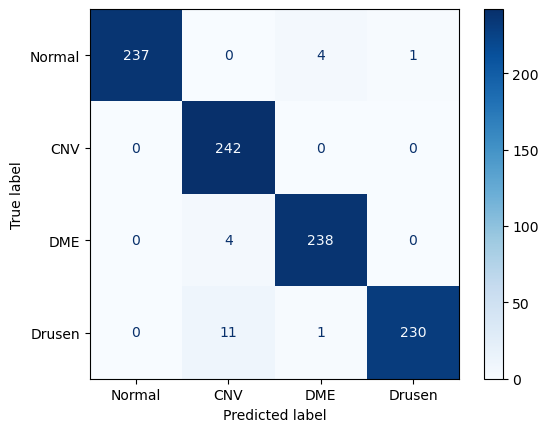

In [56]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
label_list = ['Normal', 'CNV', 'DME', 'Drusen']
cm = confusion_matrix(answer_list, pred_list)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=label_list)
disp.plot(cmap='Blues')
plt.show()

##### Calculating sensitivity, specificity

https://bo-10000.tistory.com/89

In [57]:
from sklearn.metrics import confusion_matrix
def sensitivity_specificity_per_class(y, y_pred, y_class):
    y = np.where(y==y_class, 1, 0)
    y_pred = np.where(y_pred==y_class, 1, 0)
    cfx = confusion_matrix(y, y_pred)
    sensitivity = cfx[0,0]/(cfx[0,0]+cfx[0,1])
    specificity = cfx[1,1]/(cfx[1,0]+cfx[1,1])
    return sensitivity, specificity

In [59]:
idx2label = dict()
idx2label[0] = 'Normal'
idx2label[1] = 'CNV'
idx2label[2] = 'DME'
idx2label[3] = 'Drusen'

sensitivity_specificity_dict = dict()

for i in range(4): # 4 class라
    sensitivity, specificity = sensitivity_specificity_per_class(answer_list, pred_list, i)
    print(f'sensitivity for {idx2label[i]}: ', round(sensitivity,2))
    print(f'specificity for {idx2label[i]}: ', round(specificity,2))
    print('')
    sensitivity_specificity_dict[idx2label[i]]=[sensitivity, specificity]

print('')
print(sensitivity_specificity_dict)

sensitivity for Normal:  1.0
specificity for Normal:  0.98

sensitivity for CNV:  0.98
specificity for CNV:  1.0

sensitivity for DME:  0.99
specificity for DME:  0.98

sensitivity for Drusen:  1.0
specificity for Drusen:  0.95


{'Normal': [1.0, 0.9793388429752066], 'CNV': [0.9793388429752066, 1.0], 'DME': [0.9931129476584022, 0.9834710743801653], 'Drusen': [0.9986225895316805, 0.9504132231404959]}


Sensitivity, specificity visualization
- https://jimmy-ai.tistory.com/40

In [60]:
import pandas as pd
data = sensitivity_specificity_dict
df = pd.DataFrame(data, index= ['Sensitivity', 'Specificity']).transpose()
label_list = ['Normal', 'CNV', 'DME', 'Drusen']
df

,Sensitivity,Specificity
Normal,1.000000,0.979339
CNV,0.979339,1.000000
DME,0.993113,0.983471
Drusen,0.998623,0.950413


C:\Users\김호영\AppData\Local\Temp\ipykernel_7752\751887725.py:11: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i, df['Sensitivity'][i], str(round(df['Sensitivity'][i],2)), fontsize = 10, color='black',
C:\Users\김호영\AppData\Local\Temp\ipykernel_7752\751887725.py:16: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(i+ bar_width, df['Specificity'][i], str(round(df['Specificity'][i],2)), fontsize = 10, color='black',


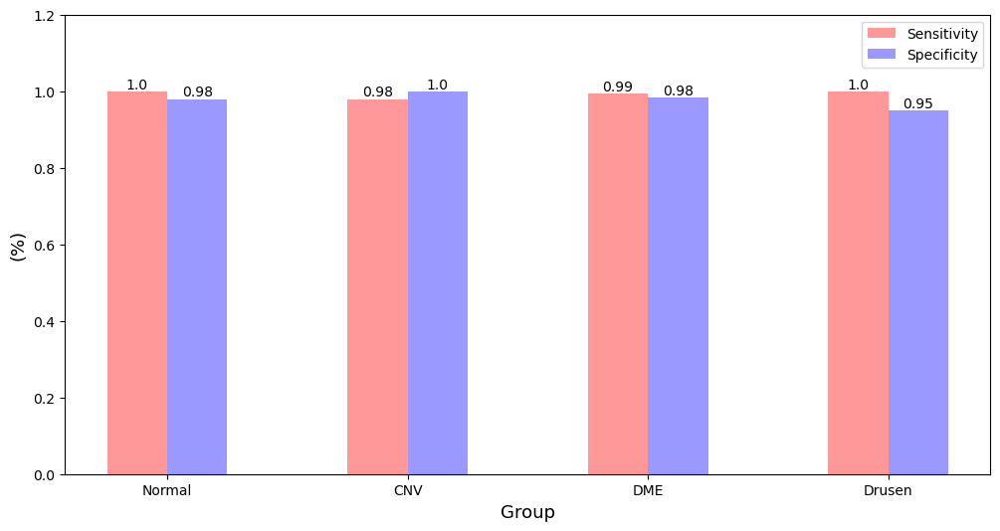

In [61]:
# 그림 사이즈, 바 굵기 조정
fig, ax = plt.subplots(figsize=(12,6))
bar_width = 0.25

# 범주가 4개이므로 0, 1, 2, 3 위치를 기준으로 삼음
index = np.arange(4)

# 각 범주별로 Sensitivity, specificity의 bar를 순서대로 나타내는 과정, 각 그래프는 0.25의 간격을 두고 그려짐
b1 = plt.bar(index, df['Sensitivity'], bar_width, alpha=0.4, color='red', label='Sensitivity')
for i in [0, 1, 2, 3]:
    plt.text(i, df['Sensitivity'][i], str(round(df['Sensitivity'][i],2)), fontsize = 10, color='black',
                horizontalalignment='center',  # horizontalalignment (left, center, right)
                verticalalignment='bottom')    # verticalalignment (top, center, bottom)
b2 = plt.bar(index + bar_width, df['Specificity'], bar_width, alpha=0.4, color='blue', label='Specificity')
for i in [0, 1, 2, 3]:
    plt.text(i+ bar_width, df['Specificity'][i], str(round(df['Specificity'][i],2)), fontsize = 10, color='black',
                horizontalalignment='center',  # horizontalalignment (left, center, right)
                verticalalignment='bottom')    # verticalalignment (top, center, bottom)


# x축 위치를 정 가운데로 조정하고 x축의 텍스트를 year 정보와 매칭
plt.xticks(np.arange(bar_width/2, 4 + bar_width/2, 1), label_list)
plt.yticks(np.arange(0, 1.4, step=0.2))

# x축, y축 이름 및 범례 설정
plt.xlabel('Group', size = 13)
plt.ylabel('(%)', size = 13)
plt.legend()
plt.show()

##### Drawing ROC curve

https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html#sphx-glr-auto-examples-model-selection-plot-roc-py

- macro average 는 라벨별 f1-score를 산술평균
- weighted average 는 라벨별 f1-score를 샘플 수(support)의 비중에 따라 가중평균
- micro average는 전체 TP, FN, FP를 평균한 것이며 이것은 다중 분류에서 Accuracy와 같음

In [62]:
from sklearn.preprocessing import LabelBinarizer

label_list = ['Normal', 'CNV', 'DME', 'Drusen']
label_binarizer = LabelBinarizer().fit(answer_list)
y_onehot_test = label_binarizer.transform(answer_list)
y_test = answer_list
y_score = pred_proba_list

class_id = 0        # 여기 수정 필요
class_of_interest = label_list[class_id]

print(y_onehot_test.shape)
print(y_onehot_test.ravel().shape)
print(y_score.shape)

(968, 4)
(3872,)
(968, 4)


In [63]:
print([round(x,2) for temp_list in y_score for x in temp_list])

[0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.99, 0.0, 0.01, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.

- ROC curve using micro-averaged OvR

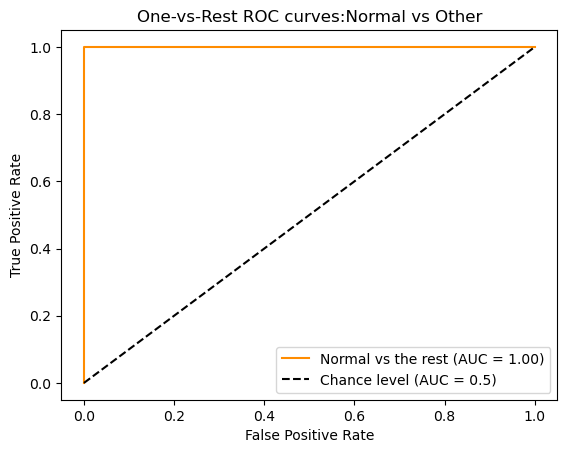

In [64]:
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

display = RocCurveDisplay.from_predictions(
    y_onehot_test[:, class_id],
    y_score[:, class_id],
    name=f"{class_of_interest} vs the rest",
    color="darkorange",
    plot_chance_level=True,
)
_ = display.ax_.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title=f"One-vs-Rest ROC curves:{label_list[class_id]} vs Other",
)

In [65]:
# AUC만 계산하고 싶은 경우 (ROC-AUC score itself에 초점)
from sklearn.metrics import roc_auc_score

micro_roc_auc_ovr = roc_auc_score(y_test, y_score, multi_class="ovr",average="micro")
print(f"Micro-averaged One-vs-Rest ROC AUC score: {micro_roc_auc_ovr:.2f}")

Micro-averaged One-vs-Rest ROC AUC score: 1.00


In [66]:
# 위의 cell과 같은 의미
from sklearn.metrics import auc, roc_curve

# store the fpr, tpr, and roc_auc for all averaging strategies
fpr, tpr, roc_auc = dict(), dict(), dict()
# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_onehot_test.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

print(f"Micro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['micro']:.2f}")

Micro-averaged One-vs-Rest ROC AUC score:
1.00


- ROC curve using the OvR macro-average

In [67]:
for i in range(len(label_list)):
    fpr[i], tpr[i], _ = roc_curve(y_onehot_test[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

fpr_grid = np.linspace(0.0, 1.0, 1000)

# Interpolate all ROC curves at these points
mean_tpr = np.zeros_like(fpr_grid)

for i in range(len(label_list)):
    mean_tpr += np.interp(fpr_grid, fpr[i], tpr[i])  # linear interpolation

# Average it and compute AUC
mean_tpr /= len(label_list)

fpr["macro"] = fpr_grid
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{roc_auc['macro']:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
1.00


In [68]:
# 위의 cell과 같은 계산 결과
macro_roc_auc_ovr = roc_auc_score(
    y_test,
    y_score,
    multi_class="ovr",
    average="macro",
)
print(f"Macro-averaged One-vs-Rest ROC AUC score:\n{macro_roc_auc_ovr:.2f}")

Macro-averaged One-vs-Rest ROC AUC score:
1.00


- Plot all OvR ROC curves together

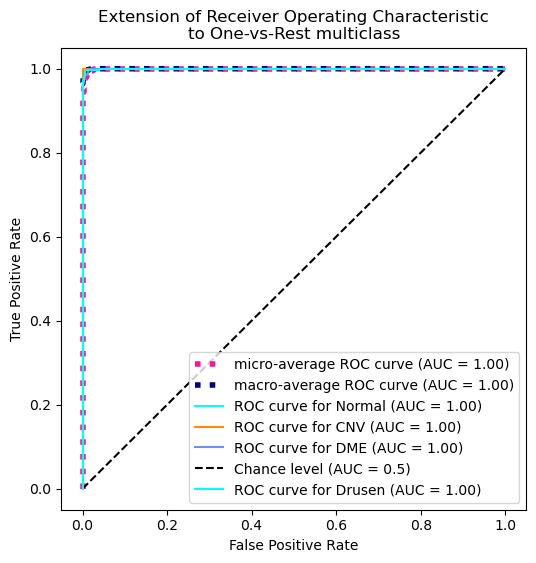

In [69]:
from itertools import cycle

fig, ax = plt.subplots(figsize=(6, 6))

plt.plot(
    fpr["micro"],
    tpr["micro"],
    label=f"micro-average ROC curve (AUC = {roc_auc['micro']:.2f})",
    color="deeppink",
    linestyle=":",
    linewidth=4,
)

plt.plot(
    fpr["macro"],
    tpr["macro"],
    label=f"macro-average ROC curve (AUC = {roc_auc['macro']:.2f})",
    color="navy",
    linestyle=":",
    linewidth=4,
)

colors = cycle(["aqua", "darkorange", "cornflowerblue"])
for class_id, color in zip(range(len(label_list)), colors):
    RocCurveDisplay.from_predictions(
        y_onehot_test[:, class_id],
        y_score[:, class_id],
        name=f"ROC curve for {label_list[class_id]}",
        color=color,
        ax=ax,
        plot_chance_level=(class_id == 2),
    )

_ = ax.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Extension of Receiver Operating Characteristic\nto One-vs-Rest multiclass",
)

- One-vs-One multiclass ROC

In [70]:
from itertools import combinations

pair_list = list(combinations(np.unique(y_test), 2))
print(pair_list)

[(0, 1), (0, 2), (0, 3), (1, 2), (1, 3), (2, 3)]


Macro-averaged One-vs-One ROC AUC score:
1.00


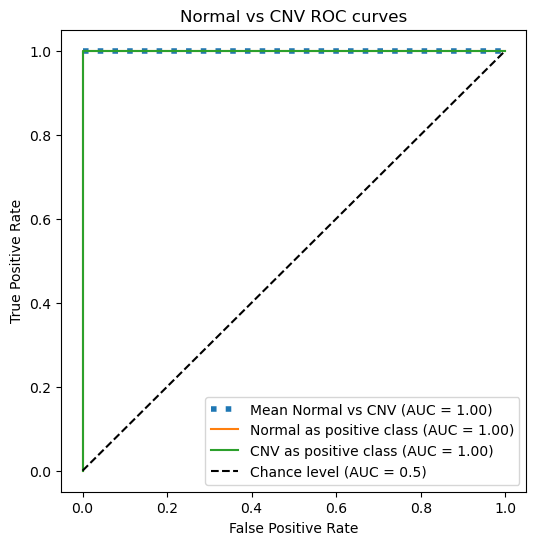

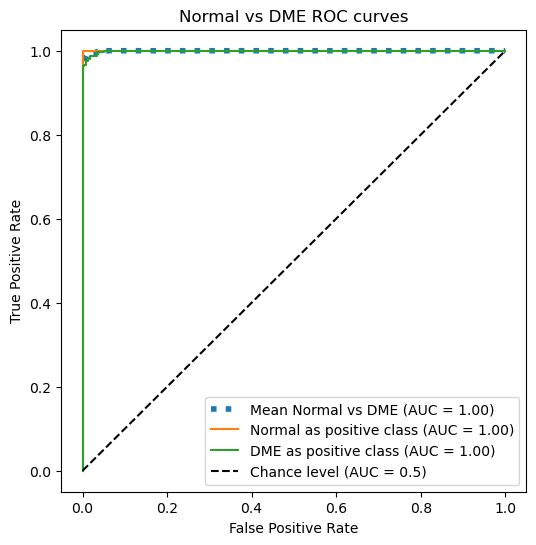

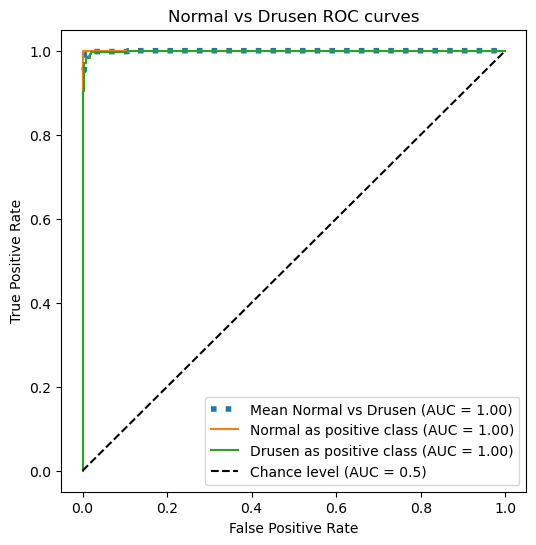

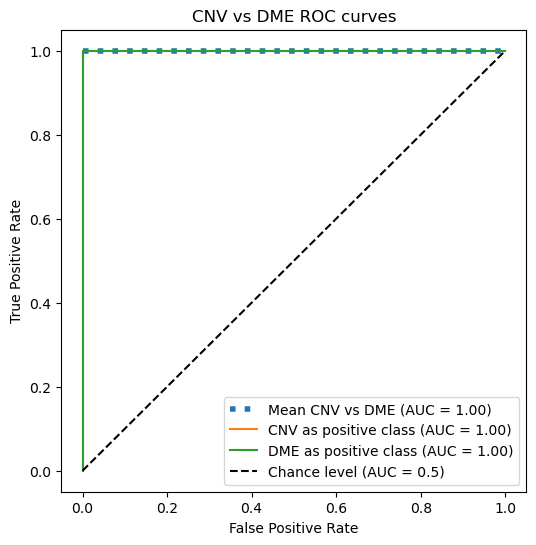

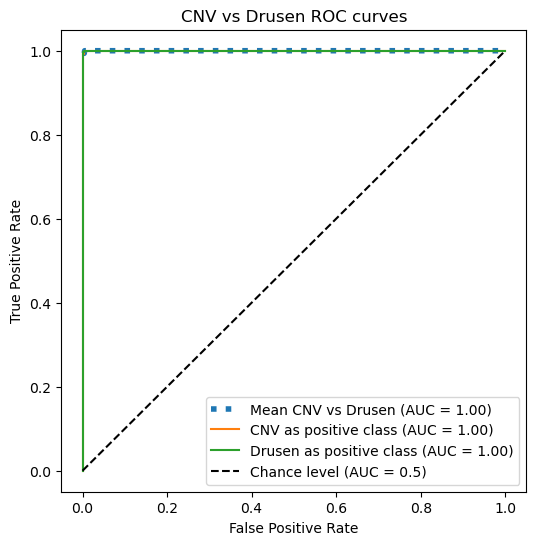

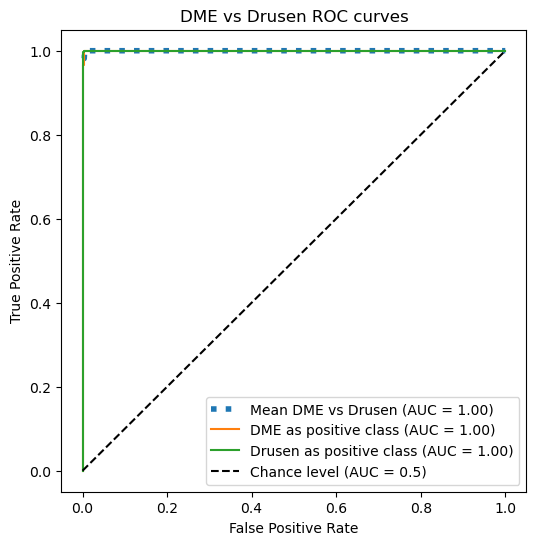

In [71]:
pair_scores = []
mean_tpr = dict()

for ix, (label_a, label_b) in enumerate(pair_list):
    a_mask = y_test == label_a
    b_mask = y_test == label_b
    ab_mask = np.logical_or(a_mask, b_mask)

    a_true = a_mask[ab_mask]
    b_true = b_mask[ab_mask]

    idx_a = np.flatnonzero(label_binarizer.classes_ == label_a)[0]
    idx_b = np.flatnonzero(label_binarizer.classes_ == label_b)[0]

    fpr_a, tpr_a, _ = roc_curve(a_true, y_score[ab_mask, idx_a])
    fpr_b, tpr_b, _ = roc_curve(b_true, y_score[ab_mask, idx_b])

    mean_tpr[ix] = np.zeros_like(fpr_grid)
    mean_tpr[ix] += np.interp(fpr_grid, fpr_a, tpr_a)
    mean_tpr[ix] += np.interp(fpr_grid, fpr_b, tpr_b)
    mean_tpr[ix] /= 2
    mean_score = auc(fpr_grid, mean_tpr[ix])
    pair_scores.append(mean_score)

    fig, ax = plt.subplots(figsize=(6, 6))
    plt.plot(
        fpr_grid,
        mean_tpr[ix],
        label=f"Mean {label_list[label_a]} vs {label_list[label_b]} (AUC = {mean_score :.2f})",
        linestyle=":",
        linewidth=4,
    )
    RocCurveDisplay.from_predictions(
        a_true,
        y_score[ab_mask, idx_a],
        ax=ax,
        name=f"{label_list[label_a]} as positive class",
    )
    RocCurveDisplay.from_predictions(
        b_true,
        y_score[ab_mask, idx_b],
        ax=ax,
        name=f"{label_list[label_b]} as positive class",
        plot_chance_level=True,
    )
    ax.set(
        xlabel="False Positive Rate",
        ylabel="True Positive Rate",
        title=f"{label_list[idx_a]} vs {label_list[label_b]} ROC curves",
    )

print(f"Macro-averaged One-vs-One ROC AUC score:\n{np.average(pair_scores):.2f}")

In [72]:
# AUC만 관심 있으면 아래처럼 하기
macro_roc_auc_ovo = roc_auc_score(
    y_test,
    y_score,
    multi_class="ovo",
    average="macro",
)

print(f"Macro-averaged One-vs-One ROC AUC score:\n{macro_roc_auc_ovo:.2f}")

Macro-averaged One-vs-One ROC AUC score:
1.00


- Plot all OvO ROC curves together

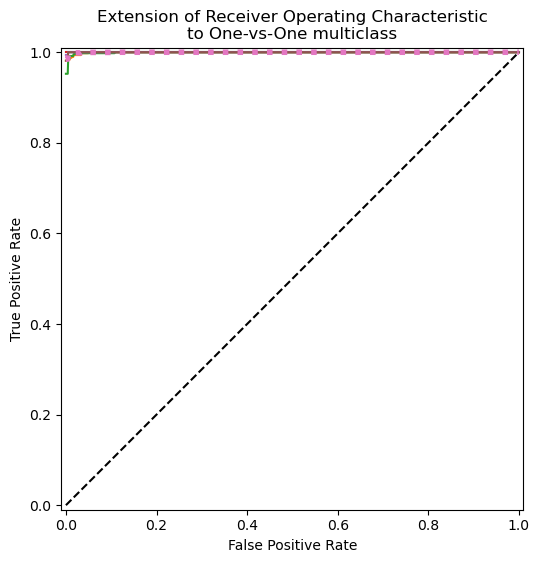

In [73]:
ovo_tpr = np.zeros_like(fpr_grid)

fig, ax = plt.subplots(figsize=(6, 6))
for ix, (label_a, label_b) in enumerate(pair_list):
    ovo_tpr += mean_tpr[ix]
    ax.plot(
        fpr_grid,
        mean_tpr[ix],
        label=f"Mean {label_list[label_a]} vs {label_list[label_b]} (AUC = {pair_scores[ix]:.2f})",
    )

ovo_tpr /= sum(1 for pair in enumerate(pair_list))

ax.plot(
    fpr_grid,
    ovo_tpr,
    label=f"One-vs-One macro-average (AUC = {macro_roc_auc_ovo:.2f})",
    linestyle=":",
    linewidth=4,
)
ax.plot([0, 1], [0, 1], "k--", label="Chance level (AUC = 0.5)")
_ = ax.set(
    xlabel="False Positive Rate",
    ylabel="True Positive Rate",
    title="Extension of Receiver Operating Characteristic\nto One-vs-One multiclass",
    aspect="equal",
    xlim=(-0.01, 1.01),
    ylim=(-0.01, 1.01),
)


### [Visualization]

##### Visualizing using matplotlib

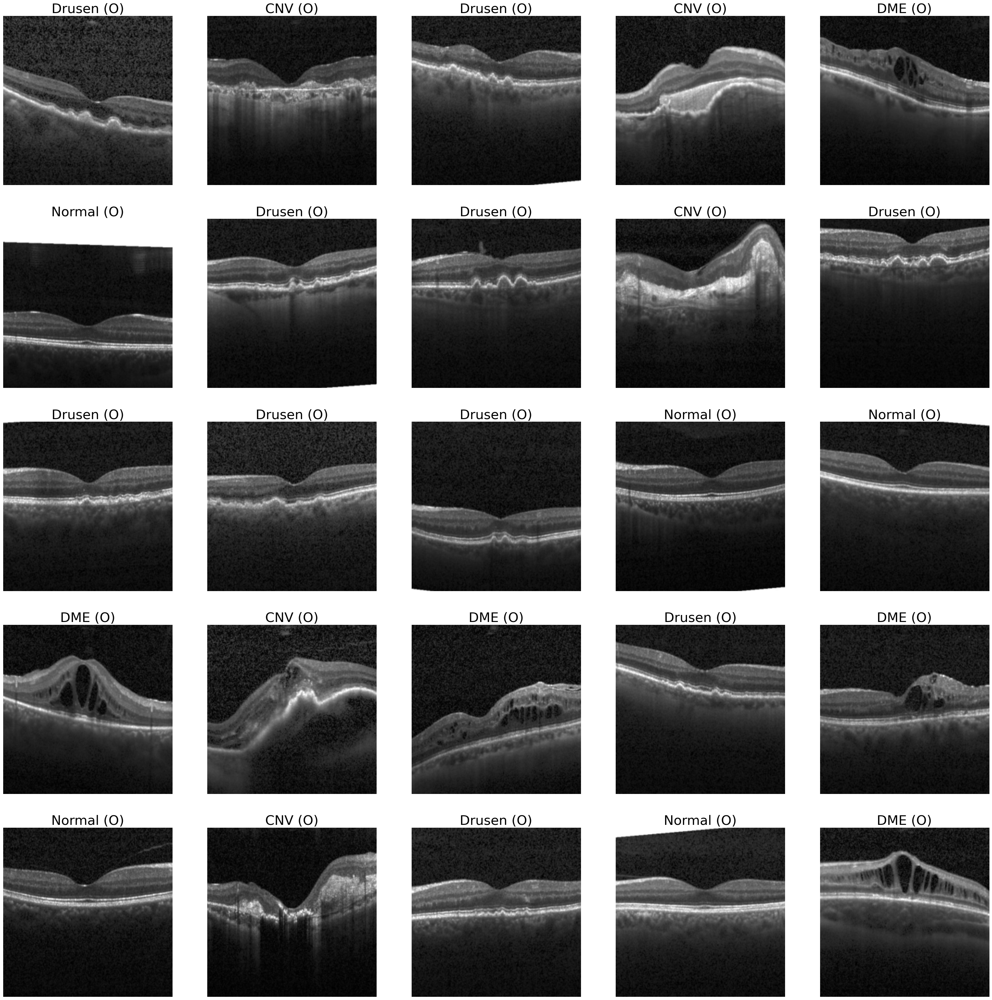

In [74]:
idx2label = dict()
idx2label[0] = 'Normal'
idx2label[1] = 'CNV'
idx2label[2] = 'DME'
idx2label[3] = 'Drusen'

columns = 5
rows = 5
fig = plt.figure(figsize=(40,40))

mobilenetv2_test.eval()

for i in range(1, columns*rows+1):
    data_idx = np.random.randint(len(test_data))
    input_img = test_data[data_idx][0].unsqueeze(dim=0).to(device) 
    output = mobilenetv2_test(input_img)
    _, argmax = torch.max(output, 1)
    pred = argmax.item()
    label = test_data[data_idx][1]

    fig.add_subplot(rows, columns, i)
    
    if pred == label:
        plt.title(f'{idx2label[pred]} (O)', fontsize=30)   # 맞은 경우 (O)로 표시
    else:
        plt.title(f'{idx2label[pred]} (X) / ANS: {idx2label[label]}', fontsize=30)   # 틀린 경우 (X)로 표시
    plot_img = test_data[data_idx][0][0]
        # 3channel로 바꾼 경우 다시 원래대로 1channel로 바꿔야 함 아래 마찬가지 / 3channel이라 [0]만 뽑아냄
    plot_img = plot_img * train_std + train_mean    # 이미지를 normalization 이전 상태로 되돌리는 작업
    transforms.functional.to_pil_image(plot_img)
    plt.imshow(plot_img, cmap='gray')
    plt.axis('off')
mobilenetv2_test.train()
plt.show()

##### Predicted values

<Figure size 1000x1000 with 0 Axes>

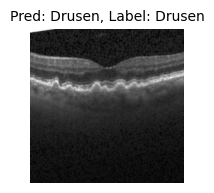

- Drusen: 97.8%
- CNV: 2.2%
- Normal: 0.0%
- DME: 0.0%


<Figure size 1000x1000 with 0 Axes>

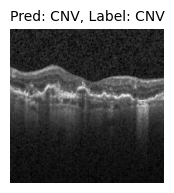

- CNV: 100.0%
- DME: 0.0%
- Drusen: 0.0%
- Normal: 0.0%


<Figure size 1000x1000 with 0 Axes>

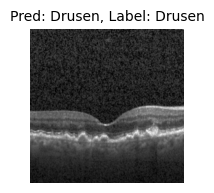

- Drusen: 73.99%
- CNV: 26.01%
- DME: 0.0%
- Normal: 0.0%


<Figure size 1000x1000 with 0 Axes>

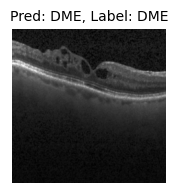

- DME: 100.0%
- CNV: 0.0%
- Drusen: 0.0%
- Normal: 0.0%


<Figure size 1000x1000 with 0 Axes>

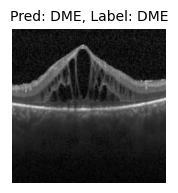

- DME: 100.0%
- Drusen: 0.0%
- Normal: 0.0%
- CNV: 0.0%


TransferMobileNetV2(
  (mobilenet_v2): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, k

In [75]:
# 5개의 임의의 image에 대해 percentage 추출하기

idx2label = dict()
idx2label[0] = 'Normal'
idx2label[1] = 'CNV'
idx2label[2] = 'DME'
idx2label[3] = 'Drusen'

label_list = ['Normal', 'CNV', 'DME', 'Drusen']

mobilenetv2_test.eval()
with torch.no_grad():
    for i in range(1,6):
        fig = plt.figure(figsize=(10,10))
        data_idx = np.random.randint(len(test_data))

        input_img = test_data[data_idx][0].unsqueeze(dim=0).to(device) 
        output = mobilenetv2_test(input_img)
        label = test_data[data_idx][1]
        pred_percent = F.softmax(output, dim=1)*100
        pred_percent = pred_percent.squeeze().tolist()
        pred_dict = {key: value for key, value in zip(label_list, pred_percent)}
        pred = sorted(pred_dict.items(), key = lambda x: x[1], reverse = True)

        plt.figure(figsize=(2,2))
        plt.imshow(input_img[0][0], cmap='gray')    # 3channel이라 [0]만 뽑아냄
        plt.title(f'Pred: {pred[0][0]}, Label: {idx2label[label]}', fontsize=10)
        plt.axis('off')
        plt.show()
        
        for i in range(len(pred)):
            print(f'- {pred[i][0]}: {round(pred[i][1],2)}%')
    
mobilenetv2_test.train()

##### GRAD-CAM

- https://csm-kr.tistory.com/74

In [121]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class GradCam(nn.Module):
    def __init__(self, model, module1, module2, module3, layer):
        super().__init__()
        self.model = model
        self.module1 = module1
        self.module2 = module2
        self.module3 = module3
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module1_name, module in self.model._modules.items():
            if module1_name == self.module1:
                for module2_name, module in module._modules.items():
                    if module2_name == self.module2:
                        for module3_name, module in module._modules.items():
                            if module3_name == self.module3:
                                for layer_name, module in module._modules.items():
                                    if layer_name == self.layer:
                                        module.register_forward_hook(self.forward_hook)
                                        module.register_backward_hook(self.backward_hook)

    def forward(self, input, target_index):
        outs = self.model(input)
        outs = outs.squeeze()  # [1, num_classes]  --> [num_classes]
		
        # 가장 큰 값을 가지는 것을 target index 로 사용 
        if target_index is None:
            target_index = outs.argmax()
        outs[target_index].backward(retain_graph=True)
        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)         # [512, 1, 1]
        out = torch.sum(a_k * self.forward_result, dim=0).cpu()                  # [512, 7, 7] * [512, 1, 1]
        out = torch.relu(out) / torch.max(out)  # 음수를 없애고, 0 ~ 1 로 scaling # [7, 7]
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [224, 224])  # 4D로 바꿈
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

In [83]:
import os
import cv2
import glob
import numpy as np

def preprocess_image(img):
    means = train_mean  # 나중에는 리스트러 놓기
    stds = train_std    # 나중에는 리스트

    preprocessed_img = img.copy()[:, :, ::-1]
    preprocessed_img = preprocessed_img - means
    preprocessed_img = preprocessed_img/stds
    '''for i in range(3):
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] - means[i]
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] / stds[i]'''
    preprocessed_img = \
        np.ascontiguousarray(np.transpose(preprocessed_img, (2, 0, 1)))
    preprocessed_img = torch.from_numpy(preprocessed_img)
    preprocessed_img.unsqueeze_(0)
    input = preprocessed_img.requires_grad_(True)
    return input

def show_cam_on_image(img, mask):
    # mask = (np.max(mask) - np.min(mask)) / (mask - np.min(mask))
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    imgRGB = cv2.cvtColor(cam, cv2.COLOR_BGR2RGB)
    return imgRGB

In [84]:
data_dir = '../data/OCT'
test_dir_name = 'test'
test_img_list = sorted(glob.glob(os.path.join(data_dir, test_dir_name, '*','*')))
img_idx = np.random.randint(len(test_img_list))
test_img_path = test_img_list[img_idx]
print(test_img_path)

../data/OCT\test\DRUSEN\DRUSEN-8811857-1.jpeg


c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


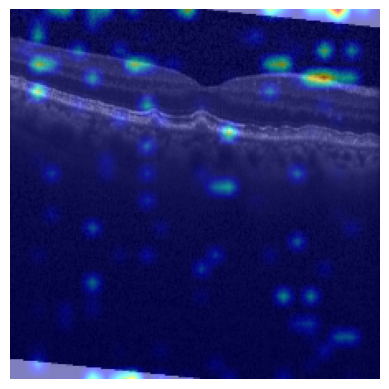

In [122]:
# Layer 6의 conv에 적용
grad_cam = GradCam(model=mobilenetv2_test.mobilenet_v2, module1='features', module2 ='6', module3 = 'conv', layer='2')
img = cv2.imread(test_img_path, 1)
img = np.float32(cv2.resize(img, (224, 224))) / 255
input = preprocess_image(img)
mask = grad_cam(input, None)
result = show_cam_on_image(img, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

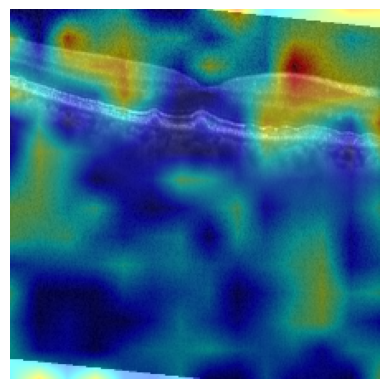

In [123]:
# Layer 12의 conv에 적용
grad_cam = GradCam(model=mobilenetv2_test.mobilenet_v2, module1='features', module2 ='12', module3 = 'conv', layer='2')
img = cv2.imread(test_img_path, 1)
img = np.float32(cv2.resize(img, (224, 224))) / 255
input = preprocess_image(img)
mask = grad_cam(input, None)
result = show_cam_on_image(img, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

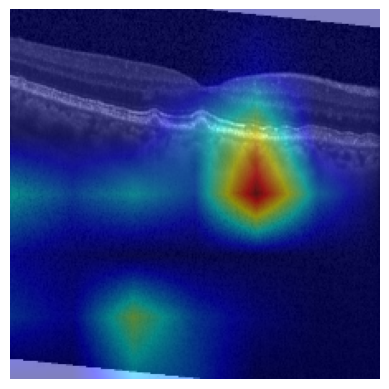

In [128]:
# Layer 18의 conv에 적용
grad_cam = GradCam(model=mobilenetv2_test, module1='mobilenet_v2', module2 ='features', module3 = '18', layer='0')
img = cv2.imread(test_img_path, 1)
img = np.float32(cv2.resize(img, (224, 224))) / 255
input = preprocess_image(img)
mask = grad_cam(input, None)
result = show_cam_on_image(img, mask)
plt.axis('off') # 창에있는 x축 y축 제거
plt.imshow(result)
plt.show()

../data/OCT\test\CNV\CNV-865813-1.jpeg


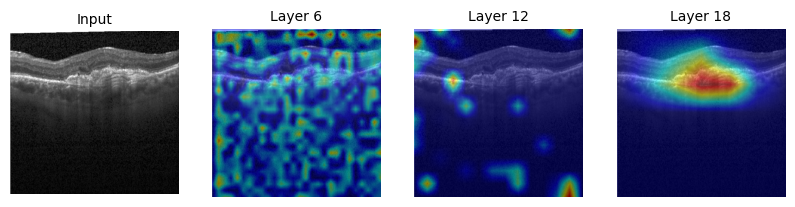

In [152]:
# Layer 6, 12, 18 각각의 conv layer에 대한 grad cam
data_dir = '../data/OCT'
test_dir_name = 'test'
test_img_list = sorted(glob.glob(os.path.join(data_dir, test_dir_name, '*','*')))
img_idx = np.random.randint(len(test_img_list))
test_img_path = test_img_list[img_idx]
print(test_img_path)

fig = plt.figure(figsize=(10,40))
fig.add_subplot(1, 4, 1)
plt.title('Input', fontsize=10)
plt.imshow(Image.open(test_img_path), cmap='gray')
plt.axis('off') # 창에있는 x축 y축 제거

for i in range(1,4):
    if i != 3:
        grad_cam = GradCam(model=mobilenetv2_test.mobilenet_v2, module1='features', module2 =str(i*6), module3 = 'conv', layer='2')
    elif i == 3:
        grad_cam = GradCam(model=mobilenetv2_test, module1='mobilenet_v2', module2 ='features', module3 = '18', layer='0')
    img = cv2.imread(test_img_path, 1)
    img = np.float32(cv2.resize(img, (224, 224))) / 255
    input = preprocess_image(img)
    mask = grad_cam(input, None)
    result = show_cam_on_image(img, mask)
    fig.add_subplot(1, 4, i+1)
    plt.title(f'Layer {6*i}', fontsize=10)
    plt.imshow(result)
    plt.axis('off') # 창에있는 x축 y축 제거
plt.show()

##### GRAD-CAM (Another version)

- https://cumulu-s.tistory.com/41
- https://github.com/PeterKim1/paper_code_review/tree/master/9.%20Visual%20Explanations%20from%20Deep%20Networks%20via%20Gradient-based%20Localization(Grad-CAM)

In [76]:
mobilenetv2_test = TransferMobileNetV2(num_classes=4).to(device) 
model_path = './saved/ckpoint_34_100.0%.pt'
checkpoint = torch.load(model_path, map_location=device)
state_dict = checkpoint['model_state_dict']
mobilenetv2_test.load_state_dict(state_dict)
mobilenetv2_test.eval()

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


TransferMobileNetV2(
  (mobilenet_v2): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, k

../data/OCT\test\DME\DME-30521-5.jpeg


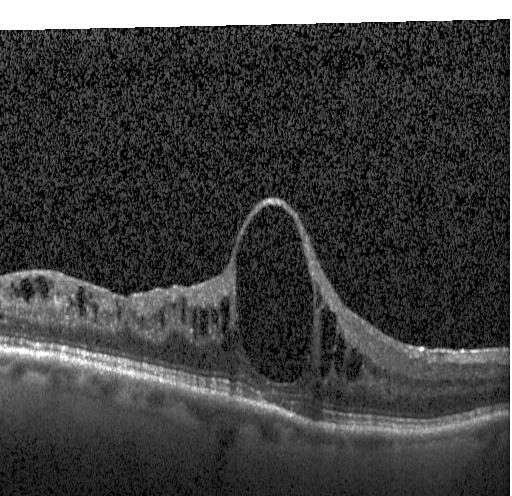

In [79]:
import cv2
from torchvision.utils import make_grid, save_image

data_dir = '../data/OCT'
test_dir_name = 'test'
test_img_list = sorted(glob.glob(os.path.join(data_dir, test_dir_name, '*','*')))
img_idx = np.random.randint(len(test_img_list))
test_img_path = test_img_list[img_idx]
print(test_img_path)

pil_img = Image.open(test_img_path)
pil_img

In [80]:
import datetime

current_time = datetime.datetime.now()
str_time = str(current_time.year)+str('_{0:02d}_'.format(current_time.month))+str('{0:02d}__'.format(current_time.day))+str('{0:02d}_'.format(current_time.hour))+str('{0:02d}'.format(current_time.minute))
dir_name = 'GradCAM_'+str_time

saved_loc = os.path.join('./output/GradCAM', dir_name)
if os.path.exists(saved_loc):
    user_input = input('Warning! rmtree 메소드는 하위 디렉토리 및 모든파일들을 삭제합니다. 계속하겠습니까? (y/n): ')
    if user_input == 'y':
        shutil.rmtree(saved_loc)
    else:
        print('중단되었습니다.')
os.mkdir(saved_loc)

print("결과 저장 위치: ", saved_loc)

결과 저장 위치:  ./output/GradCAM\GradCAM_2024_05_22__00_30


In [81]:
def normalize(tensor, mean, std):
    if not tensor.ndimension() == 4:
        raise TypeError('tensor should be 4D')

    mean = torch.FloatTensor(mean).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)
    std = torch.FloatTensor(std).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)

    return tensor.sub(mean).div(std)


class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return self.do(tensor)
    
    def do(self, tensor):
        return normalize(tensor, self.mean, self.std)
    
    def undo(self, tensor):
        return denormalize(tensor, self.mean, self.std)

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)

In [82]:
normalizer = Normalize(mean=[train_mean, train_mean, train_mean], std=[train_std, train_std, train_std])
transformation = transforms.Compose([
            transforms.Resize([256]),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
        ])
torch_img = transformation(pil_img).squeeze()                                # (1, 224, 224)
torch_img = torch.stack((torch_img, torch_img, torch_img), dim=0).unsqueeze(0)      # (1, 3, 224, 224)
normed_torch_img = normalizer(torch_img) # (1, 3, 224, 224)

In [83]:
trans_for_visualize = transforms.Compose([
            transforms.Resize([256]),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
        ])
img = trans_for_visualize(pil_img).squeeze()    # (1, 224, 224)
img = torch.stack((img, img, img), dim=0)       # (3, 224, 224)

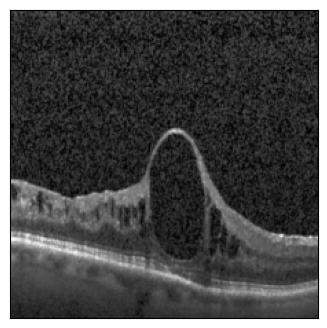

In [84]:
img = np.transpose(img.cpu().numpy().squeeze(), (1, 2, 0)) # (224, 224, 3)
plt.imshow(img)
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.show()

In [85]:
from torch.autograd import Function

class GuidedBackpropReLU(Function):
    @staticmethod
    def forward(self, input_img):
        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask = (input_img > 0).type_as(input_img)
        
        # torch.addcmul(input, tensor1, tensor2) => output = input + tensor1 x tensor 2
        # input image와 동일한 사이즈의 torch.zeros를 만든 뒤, input image와 positive_mask를 곱해서 output 생성
        # 결국은 ReLU와 동일한 효과
        output = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), input_img, positive_mask)
        
        # backward에서 사용될 forward의 input이나 output을 저장
        self.save_for_backward(input_img, output)
        return output

    @staticmethod
    def backward(self, grad_output):
        
        # forward에서 저장된 saved tensor를 불러오기
        input_img, output = self.saved_tensors
        grad_input = None

        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_1 = (input_img > 0).type_as(grad_output)
        
        # 모델의 결과 (gradient)가 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_2 = (grad_output > 0).type_as(grad_output)
        
        # 먼저 모델의 결과와 positive_mask_1과 곱해주고,
        # 다음으로는 positive_mask_2와 곱해줘서 
        # 모델의 결과가 양수이면서 input image가 양수인 부분만 남도록 만들어줌
        grad_input = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img),
                                   torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), grad_output,
                                                 positive_mask_1), positive_mask_2)
        return grad_input

In [86]:
class GuidedBackpropReLUModel:
    def __init__(self, model, use_cuda):
        self.model = model
        self.model.eval()
        self.cuda = use_cuda
        if self.cuda:
            self.model = model.cuda()

        def recursive_relu_apply(module_top):
            for idx, module in module_top._modules.items():
                recursive_relu_apply(module)
                if module.__class__.__name__ == 'ReLU':
                    module_top._modules[idx] = GuidedBackpropReLU.apply

        # replace ReLU with GuidedBackpropReLU
        recursive_relu_apply(self.model)

    def forward(self, input_img):
        return self.model(input_img)

    def __call__(self, input_img, target_category=None):        # target_category에 원하는 class를 넣기
        if self.cuda:
            input_img = input_img.cuda()

        input_img = input_img.requires_grad_(True)

        output = self.forward(input_img)

        if target_category is None:
            target_category = np.argmax(output.cpu().data.numpy())

        one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
        one_hot[0][target_category] = 1 # target_category에 해당하는 번째의 숫자만 1이고 나머지는 다 0
        one_hot = torch.from_numpy(one_hot).requires_grad_(True)
        if self.cuda:
            one_hot = one_hot.cuda()

        one_hot = torch.sum(one_hot * output)   # 원하는 output에 대한 예측만 빼냄
        # 모델이 예측한 결과값을 기준으로 backward 진행
        one_hot.backward(retain_graph=True)

        # input image의 gradient를 저장
        output = input_img.grad.cpu().data.numpy()
        output = output[0, :, :, :]
        output = output.transpose((1, 2, 0))
        return output

In [87]:
def deprocess_image(img):
    """ see https://github.com/jacobgil/keras-grad-cam/blob/master/grad-cam.py#L65 """
    img = img - np.mean(img)
    img = img / (np.std(img) + 1e-5)
    img = img * 0.1
    img = img + 0.5
    img = np.clip(img, 0, 1)
    return np.uint8(img * 255)

In [88]:
# final conv layer name 
finalconv_name = '0'

# activations
feature_blobs = []

# gradients
backward_feature = []

# output으로 나오는 feature를 feature_blobs에 append하도록
def hook_feature(module, input, output):
    feature_blobs.append(output.cpu().data)
    

# Grad-CAM
def backward_hook(module, input, output):
    backward_feature.append(output[0])
    

mobilenetv2_test.mobilenet_v2.features[18]._modules.get(finalconv_name).register_forward_hook(hook_feature)
mobilenetv2_test.mobilenet_v2.features[18]._modules.get(finalconv_name).register_backward_hook(backward_hook)

In [89]:
# get the softmax weight
params = list(mobilenetv2_test.parameters())
weight_softmax = np.squeeze(params[-2].cpu().detach().numpy())
# Prediction
logit = mobilenetv2_test(normed_torch_img)
h_x = F.softmax(logit, dim=1).data.squeeze() # softmax 적용

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


In [90]:
# ==== Grad-CAM main lines ==== #
_, argmax = torch.max(logit, 1)
label_index = argmax.item() # 0: Normal, 1: CNV, 2: DME, 3:Drusen
print(label_index)

score = logit[:, label_index].squeeze() # 예측값 y^c
score.backward(retain_graph = True) # 예측값 y^c에 대해서 backprop 진행

2


In [91]:
print(np.unique(np.array(feature_blobs)))

[-82.02051  -77.73883  -77.721466 ... 149.4599   151.60123  156.38074 ]


In [92]:
print(np.array(feature_blobs).shape)

(1, 1, 1280, 7, 7)


In [93]:
print(np.array(backward_feature).shape)

(1, 1, 1280, 7, 7)


In [94]:
activations = feature_blobs[0].to(device) # (1, 1280, 7, 7), forward pass를 진행하면서 얻게 되는 마지막 conv layer의 feature map: forward activations
gradients = backward_feature[0] # (1, 1280, 7, 7), 마지막 conv layer의 feature map의 gradient, backward gradients
b, k, u, v = gradients.size()

alpha = gradients.view(b, k, -1).mean(2) # (1, 1280, 7*7) => (1, 1280), feature map k의 'importance'를 의미
                                        # 3번째 차원을 기준으로 평균내기
weights = alpha.view(b, k, 1, 1) # (1, 1280, 1, 1)

In [95]:
# Linear combination
grad_cam_map = (weights*activations).sum(1, keepdim = True) # alpha * A^k = (1, 1280, 7, 7) => (1, 1, 7, 7): 두 번째 차원으로 더해주기
grad_cam_map = F.relu(grad_cam_map) # Apply R e L U -> 여기까지가 아래 (2)번식 구현
grad_cam_map = F.interpolate(grad_cam_map, size=(224, 224), mode='bilinear', align_corners=False) # (1, 1, 224, 224)로 Upsampling
map_min, map_max = grad_cam_map.min(), grad_cam_map.max()
grad_cam_map = (grad_cam_map - map_min).div(map_max - map_min).data # (1, 1, 224, 224), min-max scaling

In [96]:
# grad_cam_map.squeeze() : (224, 224)
grad_heatmap = cv2.applyColorMap(np.uint8(255 * grad_cam_map.squeeze().cpu()), cv2.COLORMAP_JET) # (224, 224, 3), numpy

# Grad-CAM heatmap save
cv2.imwrite(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg"), grad_heatmap)

grad_heatmap = np.float32(grad_heatmap) / 255

grad_result = grad_heatmap + img
grad_result = grad_result / np.max(grad_result)
grad_result = np.uint8(255 * grad_result)

# Grad-CAM Result save
cv2.imwrite(os.path.join(saved_loc, "Grad_Result.jpg"), grad_result)

True

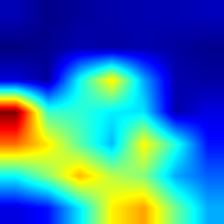

In [97]:
Image.open(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg"))

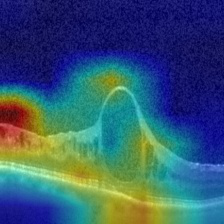

In [98]:
Image.open(os.path.join(saved_loc, "Grad_Result.jpg"))

In [99]:
# ==Guided-Backprop main lines= #
# gb_model => ReLU function in resnet50 change to GuidedBackpropReLU.
gb_model = GuidedBackpropReLUModel(model=mobilenetv2_test, use_cuda=False)    # densenet121_test내 ReLU를 GuidedBackpropReLU로 바꾸기
gb_num = gb_model(torch_img, target_category = label_index) # 이 모델에 image를 투입하여 얻게 되는 Guided Backpropagation 이미지는 gb_num
gb = deprocess_image(gb_num) # (224, 224, 3), numpy

# Guided Backprop save
cv2.imwrite(os.path.join(saved_loc, "Guided_Backprop.jpg"), gb)

True

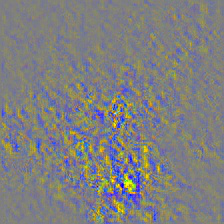

In [100]:
Image.open(os.path.join(saved_loc, "Guided_Backprop.jpg"))

In [101]:
# Guided-Backpropagation * Grad-CAM => Guided Grad-CAM 
# See Fig. 2 in paper.
# grad_cam_map : (1, 1, 224, 224) , torch.Tensor
grayscale_cam = grad_cam_map.squeeze(0).cpu().numpy() # (1, 224, 224), numpy
grayscale_cam = grayscale_cam[0, :] # (224, 224)
cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam]) # (224, 224, 3) 이렇게 합쳐주기

cam_gb = deprocess_image(cam_mask * gb_num) # Guidedbackpropmodel에 img 투입해서 얻은 output인 gb_num과 mask를 곱하기

# Guided Grad-CAM save
cv2.imwrite(os.path.join(saved_loc, "Guided_Grad_CAM.jpg"), cam_gb)

True

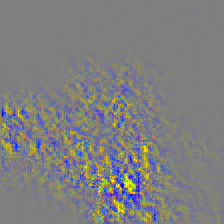

In [102]:
Image.open(os.path.join(saved_loc, "Guided_Grad_CAM.jpg"))

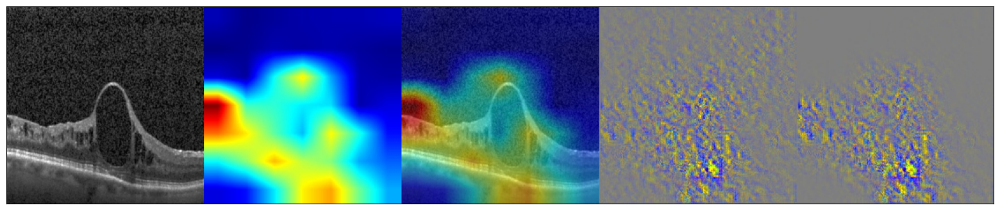

In [103]:
# 그림 만들기
pil_img = Image.open(test_img_path)
pil_transform = transforms.Compose([
            transforms.Resize([256]),
            transforms.CenterCrop(224),
        ])

Original_image = cv2.cvtColor(np.array(pil_transform(pil_img)), cv2.COLOR_RGB2BGR) # Pil -> Open CV
G_heatmap = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg")), cv2.COLOR_BGR2RGB)
G_result = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_Result.jpg")), cv2.COLOR_BGR2RGB)
G_Back = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Backprop.jpg")), cv2.COLOR_BGR2RGB)
G_CAM = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Grad_CAM.jpg")), cv2.COLOR_BGR2RGB)

Total = cv2.hconcat([Original_image, G_heatmap, G_result, G_Back, G_CAM])

plt.rcParams["figure.figsize"] = (20, 4)
plt.imshow(Total)
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.savefig(os.path.join(saved_loc, "Final_result.jpg"))
plt.show()

# 왼쪽에서부터 input - Grad-CAM - Grad-CAM - Guide-backprop - Guide-Grad-CAM 순서

### [Final test visualization]
= Input image + prediction + label + predicted percentage + GRAD-CAM + Guide-backprop + Guide-Grad-CAM

- Model construction

In [234]:
mobilenetv2_test = TransferMobileNetV2(num_classes=4).to(device) 
model_path = './saved/ckpoint_34_100.0%.pt'
checkpoint = torch.load(model_path, map_location=device)
state_dict = checkpoint['model_state_dict']
mobilenetv2_test.load_state_dict(state_dict)
mobilenetv2_test.eval()

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


TransferMobileNetV2(
  (mobilenet_v2): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, k

- ##### Select input image and make prediction using DenseNet121

In [235]:
import datetime

def make_saved_dir(dir):
    current_time = datetime.datetime.now()
    str_time = str(current_time.year)+str('_{0:02d}_'.format(current_time.month))+str('{0:02d}__'.format(current_time.day))+str('{0:02d}_'.format(current_time.hour))+str('{0:02d}'.format(current_time.minute))
    dir_name = 'Final_output_'+str_time

    saved_loc = os.path.join(dir, dir_name)
    if os.path.exists(saved_loc):
        user_input = input('Warning! rmtree 메소드는 하위 디렉토리 및 모든파일들을 삭제합니다. 계속하겠습니까? (y/n): ')
        if user_input == 'y':
            shutil.rmtree(saved_loc)
        else:
            print('중단되었습니다.')
    os.mkdir(saved_loc)

    print("결과 저장 위치: ", saved_loc)
    return saved_loc

In [236]:
def normalize(tensor, mean, std):
    if not tensor.ndimension() == 4:
        raise TypeError('tensor should be 4D')

    mean = torch.FloatTensor(mean).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)
    std = torch.FloatTensor(std).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)

    return tensor.sub(mean).div(std)


class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return self.do(tensor)
    
    def do(self, tensor):
        return normalize(tensor, self.mean, self.std)
    
    def undo(self, tensor):
        return denormalize(tensor, self.mean, self.std)

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)


def select_input_img(data_dir, test_dir_name):
    '''
    Input:  data_dir = path of directory which contains data
            test_dir_name = name of directory wich contains test data
    Output: image opened by PIL.Image
    '''
    test_img_list = sorted(glob.glob(os.path.join(data_dir, test_dir_name, '*','*')))
    img_idx = np.random.randint(len(test_img_list))
    test_img_path = test_img_list[img_idx]
    pil_img = Image.open(test_img_path)
    return test_img_path, pil_img


def img_to_tensor(train_mean, train_std, pil_img):
    '''
    Input:  pil_img = image opened by PIL.Image
    Output: transformed image tensor with size (3,224,224)
    '''
    normalizer = Normalize(mean=[train_mean, train_mean, train_mean], std=[train_std, train_std, train_std])
    transformation = transforms.Compose([
            transforms.Resize([256]),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
        ])
    pil_img_tf = transformation(pil_img).squeeze()                          # (1, 224, 224)
    pil_img_tf = torch.stack((pil_img_tf, pil_img_tf, pil_img_tf), dim=0)   # (3, 224, 224)
    normed_pil_img_tf = normalizer(pil_img_tf.unsqueeze(0))
    return pil_img_tf, normed_pil_img_tf


def make_pred(model, input):
    '''
    Input:  model = our model (in this case, densenet121 after transfer learning)
            input = input image (in this case, tensor image with size (3, 224, 224))
    Output: output = 4 number tensor, actual output made by our model
            pred = integer, prediction made by our model (result of argmax of our output)
    '''
    output = model(input)
    _, argmax = torch.max(output, 1)
    pred = argmax.item()
    return output, pred


def find_label(img_path):
    '''
    Input:  img_path = path of certain image
    Output: String, Label of the image
    '''
    _, file_name = os.path.split(img_path)
    file_name_list = file_name.split('-')
    label = file_name_list[0]
    return label

In [246]:
# Index to label, label to index dictionary
idx2label = {0: 'Normal', 1: 'CNV',
             2: 'DME', 3: 'Drusen'}
    # CNV: Choroidal neovascularization, DME: Diabetic macular edema
label2idx = {v:k for k,v in idx2label.items()}

# Label list
label_list = ['Normal', 'CNV', 'DME', 'Drusen']

# Select input image and Image transformation
test_img_path, pil_img = select_input_img(data_dir = '../data/OCT', test_dir_name = 'test')
pil_img_tf, normed_pil_img_tf = img_to_tensor(train_mean, train_std, pil_img)    # (1, 3, 224, 224)
print(test_img_path)

img = np.transpose(pil_img_tf.cpu().numpy().squeeze(), (1, 2, 0)) # (224, 224, 3)

../data/OCT\test\DRUSEN\DRUSEN-8281517-1.jpeg


In [247]:
saved_loc = make_saved_dir(dir='./output/Final_output')

결과 저장 위치:  ./output/Final_output\Final_output_2024_05_22__00_47


In [248]:
def make_pred_bar_chart(output, saved_loc, label_list, subtitle_fontdict):
    '''
    Input:  output = outcome came from densenet121
            subplot = Certain subplot of matplotlib
            label_list = list with label
    Output: Bar chart
    '''
    with torch.no_grad():
        # Prediction 계산
        pred_percent = F.softmax(output, dim=1)*100
        pred_percent = pred_percent.squeeze().tolist()
        pred_percent = [round(x,2) for x in pred_percent]

    # chart 그리기
    plt.rcParams["figure.figsize"] = (8,8)
    plt.bar(label_list, pred_percent, color='blue', alpha = 0.4)
    plt.xticks([0, 1, 2, 3], label = label_list, **subtitle_fontdict)
    
    for i, v in enumerate([0, 1, 2, 3]):
        plt.text(v, pred_percent[i], str(pred_percent[i])+'%', fontsize = 15, color='black',
                    horizontalalignment='center',  # horizontalalignment (left, center, right)
                    verticalalignment='bottom')    # verticalalignment (top, center, bottom)

    plt.savefig(os.path.join(saved_loc, "Prediction_bar_chart.jpg"), format='jpeg')

- ##### Predicted percentage

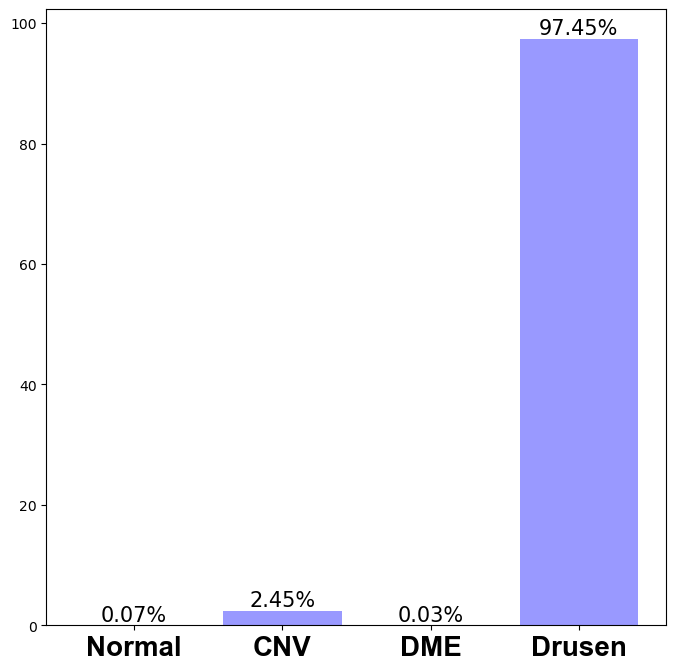

In [249]:
# Make prediction using densenet121
output, pred = make_pred(model = mobilenetv2_test, input = normed_pil_img_tf)

# Find label of the input image
label = find_label(img_path=test_img_path)
if label.lower() == 'normal':
    label = label.capitalize()
elif label.lower() == 'drusen':
    label = label.capitalize()

# Make table of prediction
subtitle_fontdict={'fontname': 'Arial','fontsize': 20, 'fontweight': 'bold'}
make_pred_bar_chart(output = output, saved_loc=saved_loc, label_list = label_list, subtitle_fontdict=subtitle_fontdict)

- ##### Grad-CAM + Guided Grad-CAM

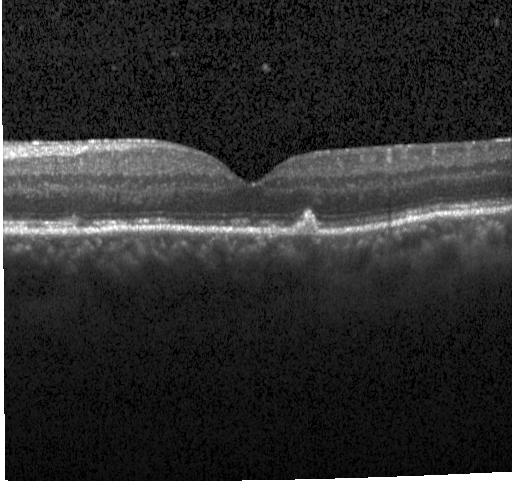

In [250]:
import cv2
from torchvision.utils import make_grid, save_image

pil_img = Image.open(test_img_path)
pil_img

In [251]:
def normalize(tensor, mean, std):
    if not tensor.ndimension() == 4:
        raise TypeError('tensor should be 4D')

    mean = torch.FloatTensor(mean).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)
    std = torch.FloatTensor(std).view(1, 3, 1, 1).expand_as(tensor).to(tensor.device)

    return tensor.sub(mean).div(std)


class Normalize(object):
    def __init__(self, mean, std):
        self.mean = mean
        self.std = std

    def __call__(self, tensor):
        return self.do(tensor)
    
    def do(self, tensor):
        return normalize(tensor, self.mean, self.std)
    
    def undo(self, tensor):
        return denormalize(tensor, self.mean, self.std)

    def __repr__(self):
        return self.__class__.__name__ + '(mean={0}, std={1})'.format(self.mean, self.std)

normalizer = Normalize(mean=[train_mean, train_mean, train_mean], std=[train_std, train_std, train_std])
transformation = transforms.Compose([
            transforms.Resize([256]),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
        ])
torch_img = transformation(pil_img).squeeze()                                # (1, 224, 224)
torch_img = torch.stack((torch_img, torch_img, torch_img), dim=0).unsqueeze(0)      # (1, 3, 224, 224)
normed_torch_img = normalizer(torch_img) # (1, 3, 224, 224)

In [252]:
trans_for_visualize = transforms.Compose([
            transforms.Resize([256]),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
        ])
img = trans_for_visualize(pil_img).squeeze()    # (1, 224, 224)
img = torch.stack((img, img, img), dim=0)       # (3, 224, 224)

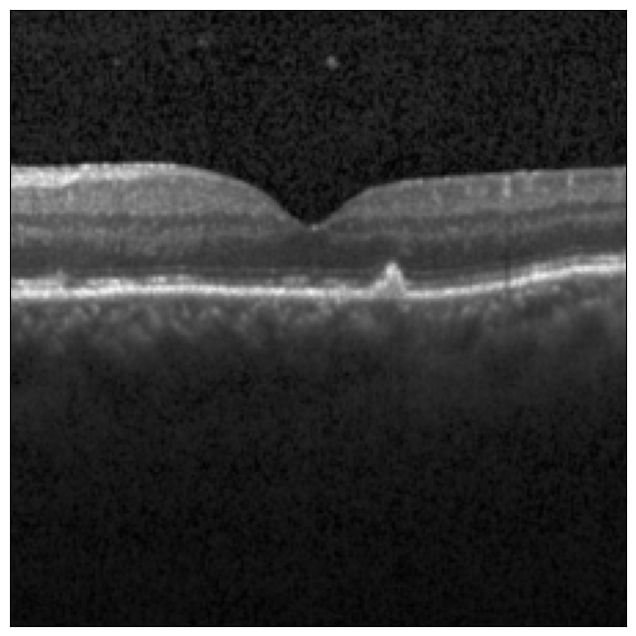

In [253]:
img = np.transpose(img.cpu().numpy().squeeze(), (1, 2, 0)) # (224, 224, 3)
plt.imshow(img)
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.show()

In [254]:
from torch.autograd import Function

class GuidedBackpropReLU(Function):
    @staticmethod
    def forward(self, input_img):
        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask = (input_img > 0).type_as(input_img)
        
        # torch.addcmul(input, tensor1, tensor2) => output = input + tensor1 x tensor 2
        # input image와 동일한 사이즈의 torch.zeros를 만든 뒤, input image와 positive_mask를 곱해서 output 생성
        # 결국은 ReLU와 동일한 효과
        output = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), input_img, positive_mask)
        
        # backward에서 사용될 forward의 input이나 output을 저장
        self.save_for_backward(input_img, output)
        return output

    @staticmethod
    def backward(self, grad_output):
        
        # forward에서 저장된 saved tensor를 불러오기
        input_img, output = self.saved_tensors
        grad_input = None

        # input image 기준으로 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_1 = (input_img > 0).type_as(grad_output)
        
        # 모델의 결과 (gradient)가 양수인 부분만 1로 만드는 positive_mask 생성
        positive_mask_2 = (grad_output > 0).type_as(grad_output)
        
        # 먼저 모델의 결과와 positive_mask_1과 곱해주고,
        # 다음으로는 positive_mask_2와 곱해줘서 
        # 모델의 결과가 양수이면서 input image가 양수인 부분만 남도록 만들어줌
        grad_input = torch.addcmul(torch.zeros(input_img.size()).type_as(input_img),
                                   torch.addcmul(torch.zeros(input_img.size()).type_as(input_img), grad_output,
                                                 positive_mask_1), positive_mask_2)
        return grad_input

class GuidedBackpropReLUModel:
    def __init__(self, model, use_cuda):
        self.model = model
        self.model.eval()
        self.cuda = use_cuda
        if self.cuda:
            self.model = model.cuda()

        def recursive_relu_apply(module_top):
            for idx, module in module_top._modules.items():
                recursive_relu_apply(module)
                if module.__class__.__name__ == 'ReLU':
                    module_top._modules[idx] = GuidedBackpropReLU.apply

        # replace ReLU with GuidedBackpropReLU
        recursive_relu_apply(self.model)

    def forward(self, input_img):
        return self.model(input_img)

    def __call__(self, input_img, target_category=None):        # target_category에 원하는 class를 넣기
        if self.cuda:
            input_img = input_img.cuda()

        input_img = input_img.requires_grad_(True)

        output = self.forward(input_img)

        if target_category is None:
            target_category = np.argmax(output.cpu().data.numpy())

        one_hot = np.zeros((1, output.size()[-1]), dtype=np.float32)
        one_hot[0][target_category] = 1 # target_category에 해당하는 번째의 숫자만 1이고 나머지는 다 0
        one_hot = torch.from_numpy(one_hot).requires_grad_(True)
        if self.cuda:
            one_hot = one_hot.cuda()

        one_hot = torch.sum(one_hot * output)   # 원하는 output에 대한 예측만 빼냄
        # 모델이 예측한 결과값을 기준으로 backward 진행
        one_hot.backward(retain_graph=True)

        # input image의 gradient를 저장
        output = input_img.grad.cpu().data.numpy()
        output = output[0, :, :, :]
        output = output.transpose((1, 2, 0))
        return output

def deprocess_image(img):
    """ see https://github.com/jacobgil/keras-grad-cam/blob/master/grad-cam.py#L65 """
    img = img - np.mean(img)
    img = img / (np.std(img) + 1e-5)
    img = img * 0.1
    img = img + 0.5
    img = np.clip(img, 0, 1)
    return np.uint8(img * 255)

In [255]:
# final conv layer name 
finalconv_name = '0'

# activations
feature_blobs = []

# gradients
backward_feature = []

# output으로 나오는 feature를 feature_blobs에 append하도록
def hook_feature(module, input, output):
    feature_blobs.append(output.cpu().data)
    

# Grad-CAM
def backward_hook(module, input, output):
    backward_feature.append(output[0])
    
mobilenetv2_test.mobilenet_v2.features[18]._modules.get(finalconv_name).register_forward_hook(hook_feature)
mobilenetv2_test.mobilenet_v2.features[18]._modules.get(finalconv_name).register_backward_hook(backward_hook)

# get the softmax weight
params = list(mobilenetv2_test.parameters())
weight_softmax = np.squeeze(params[-2].cpu().detach().numpy())
# Prediction
logit = mobilenetv2_test(normed_torch_img)
print(logit)
h_x = F.softmax(logit, dim=1).data.squeeze() # softmax 적용

# ==== Grad-CAM main lines ==== #
_, argmax = torch.max(logit, 1)
label_index = argmax.item() # 0: Normal, 1: CNV, 2: DME, 3:Drusen
print(label_index)

score = logit[:, label_index].squeeze() # 예측값 y^c
score.backward(retain_graph = True) # 예측값 y^c에 대해서 backprop 진행

activations = feature_blobs[0].to(device) # (1, 2048, 7, 7), forward pass를 진행하면서 얻게 되는 마지막 conv layer의 feature map: forward activations
gradients = backward_feature[0] # (1, 2048, 7, 7), 마지막 conv layer의 feature map의 gradient, backward gradients
b, k, u, v = gradients.size()

alpha = gradients.view(b, k, -1).mean(2) # (1, 2048, 7*7) => (1, 2048), feature map k의 'importance'를 의미
                                        # 3번째 차원을 기준으로 평균내기
weights = alpha.view(b, k, 1, 1) # (1, 512, 1, 1)

# Linear combination
grad_cam_map = (weights*activations).sum(1, keepdim = True) # alpha * A^k = (1, 2048, 7, 7) => (1, 1, 7, 7): 두 번째 차원으로 더해주기
grad_cam_map = F.relu(grad_cam_map) # Apply R e L U -> 여기까지가 아래 (2)번식 구현
grad_cam_map = F.interpolate(grad_cam_map, size=(224, 224), mode='bilinear', align_corners=False) # (1, 1, 224, 224)로 Upsampling
map_min, map_max = grad_cam_map.min(), grad_cam_map.max()
grad_cam_map = (grad_cam_map - map_min).div(map_max - map_min).data # (1, 1, 224, 224), min-max scaling

# grad_cam_map.squeeze() : (224, 224)
grad_heatmap = cv2.applyColorMap(np.uint8(255 * grad_cam_map.squeeze().cpu()), cv2.COLORMAP_JET) # (224, 224, 3), numpy

# Grad-CAM heatmap save
cv2.imwrite(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg"), grad_heatmap)

grad_heatmap = np.float32(grad_heatmap) / 255

grad_result = grad_heatmap + img
grad_result = grad_result / np.max(grad_result)
grad_result = np.uint8(255 * grad_result)

# Grad-CAM Result save
cv2.imwrite(os.path.join(saved_loc, "Grad_Result.jpg"), grad_result)

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


tensor([[-5.2544, -1.6434, -6.0534,  2.0391]], grad_fn=<AddmmBackward0>)
3


True

In [256]:
# ==Guided-Backprop main lines= #
# gb_model => ReLU function in resnet50 change to GuidedBackpropReLU.
gb_model = GuidedBackpropReLUModel(model=mobilenetv2_test, use_cuda=False)    # densenet121_test 안에 ReLU를 GuidedBackpropReLU로 바꾸기
gb_num = gb_model(torch_img, target_category = label_index) # 이 모델에 image를 투입하여 얻게 되는 Guided Backpropagation 이미지는 gb_num
gb = deprocess_image(gb_num) # (224, 224, 3), numpy

# Guided Backprop save
cv2.imwrite(os.path.join(saved_loc, "Guided_Backprop.jpg"), gb)

# Guided-Backpropagation * Grad-CAM => Guided Grad-CAM 
# See Fig. 2 in paper.
# grad_cam_map : (1, 1, 224, 224) , torch.Tensor
grayscale_cam = grad_cam_map.squeeze(0).cpu().numpy() # (1, 224, 224), numpy
grayscale_cam = grayscale_cam[0, :] # (224, 224)
cam_mask = cv2.merge([grayscale_cam, grayscale_cam, grayscale_cam]) # (224, 224, 3) 이렇게 합쳐주기

cam_gb = deprocess_image(cam_mask * gb_num) # Guidedbackpropmodel에 img 투입해서 얻은 output인 gb_num과 mask를 곱하기

# Guided Grad-CAM save
cv2.imwrite(os.path.join(saved_loc, "Guided_Grad_CAM.jpg"), cam_gb)

True

- ##### Grad-CAM by layer

In [257]:
# Reload model
mobilenetv2_test = TransferMobileNetV2(num_classes=4).to(device) 
model_path = './saved/ckpoint_34_100.0%.pt'
checkpoint = torch.load(model_path, map_location=device)
state_dict = checkpoint['model_state_dict']
mobilenetv2_test.load_state_dict(state_dict)
mobilenetv2_test.eval()

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


TransferMobileNetV2(
  (mobilenet_v2): MobileNetV2(
    (features): Sequential(
      (0): Conv2dNormActivation(
        (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
        (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU6(inplace=True)
      )
      (1): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
            (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
            (2): ReLU6(inplace=True)
          )
          (1): Conv2d(32, 16, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (2): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (2): InvertedResidual(
        (conv): Sequential(
          (0): Conv2dNormActivation(
            (0): Conv2d(16, 96, k

In [258]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class GradCam(nn.Module):
    def __init__(self, model, module1, module2, module3, layer):
        super().__init__()
        self.model = model
        self.module1 = module1
        self.module2 = module2
        self.module3 = module3
        self.layer = layer
        self.register_hooks()

    def register_hooks(self):
        for module1_name, module in self.model._modules.items():
            if module1_name == self.module1:
                for module2_name, module in module._modules.items():
                    if module2_name == self.module2:
                        for module3_name, module in module._modules.items():
                            if module3_name == self.module3:
                                for layer_name, module in module._modules.items():
                                    if layer_name == self.layer:
                                        module.register_forward_hook(self.forward_hook)
                                        module.register_backward_hook(self.backward_hook)

    def forward(self, input, target_index):
        outs = self.model(input)
        outs = outs.squeeze()  # [1, num_classes]  --> [num_classes]
		
        # 가장 큰 값을 가지는 것을 target index 로 사용 
        if target_index is None:
            target_index = outs.argmax()
        outs[target_index].backward(retain_graph=True)
        a_k = torch.mean(self.backward_result, dim=(1, 2), keepdim=True)         # [512, 1, 1]
        out = torch.sum(a_k * self.forward_result, dim=0).cpu()                  # [512, 7, 7] * [512, 1, 1]
        out = torch.relu(out) / torch.max(out)  # 음수를 없애고, 0 ~ 1 로 scaling # [7, 7]
        out = F.upsample_bilinear(out.unsqueeze(0).unsqueeze(0), [224, 224])  # 4D로 바꿈
        return out.cpu().detach().squeeze().numpy()

    def forward_hook(self, _, input, output):
        self.forward_result = torch.squeeze(output)

    def backward_hook(self, _, grad_input, grad_output):
        self.backward_result = torch.squeeze(grad_output[0])

import os
import cv2
import glob
import numpy as np

def preprocess_image(img):
    means = train_mean  # 나중에는 리스트러 놓기
    stds = train_std    # 나중에는 리스트

    preprocessed_img = img.copy()[:, :, ::-1]
    preprocessed_img = preprocessed_img - means
    preprocessed_img = preprocessed_img/stds
    '''for i in range(3):
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] - means[i]
        preprocessed_img[:, :, i] = preprocessed_img[:, :, i] / stds[i]'''
    preprocessed_img = \
        np.ascontiguousarray(np.transpose(preprocessed_img, (2, 0, 1)))
    preprocessed_img = torch.from_numpy(preprocessed_img)
    preprocessed_img.unsqueeze_(0)
    input = preprocessed_img.requires_grad_(True)
    return input

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


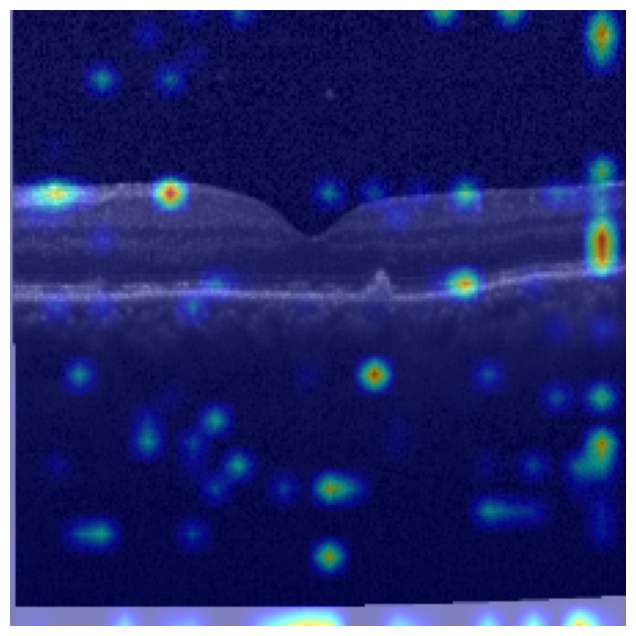

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


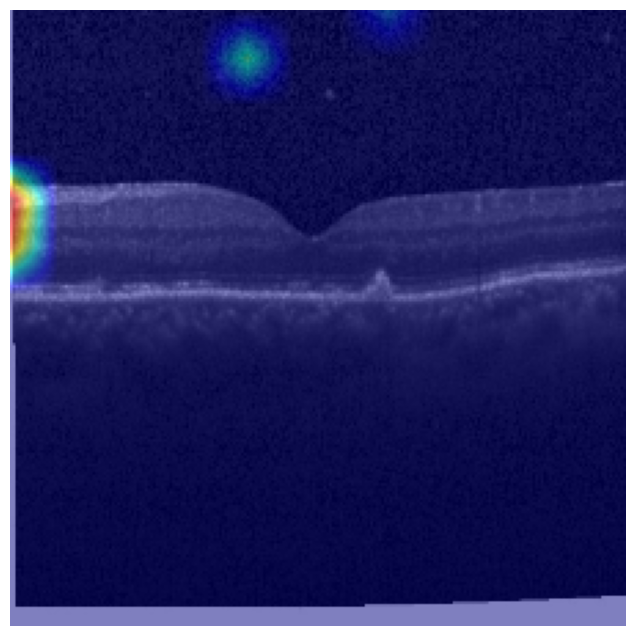

c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\modules\module.py:1352: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "
c:\ProgramData\miniconda3\envs\for_learning\lib\site-packages\torch\nn\functional.py:4158: UserWarning: nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.
  warnings.warn("nn.functional.upsample_bilinear is deprecated. Use nn.functional.interpolate instead.")


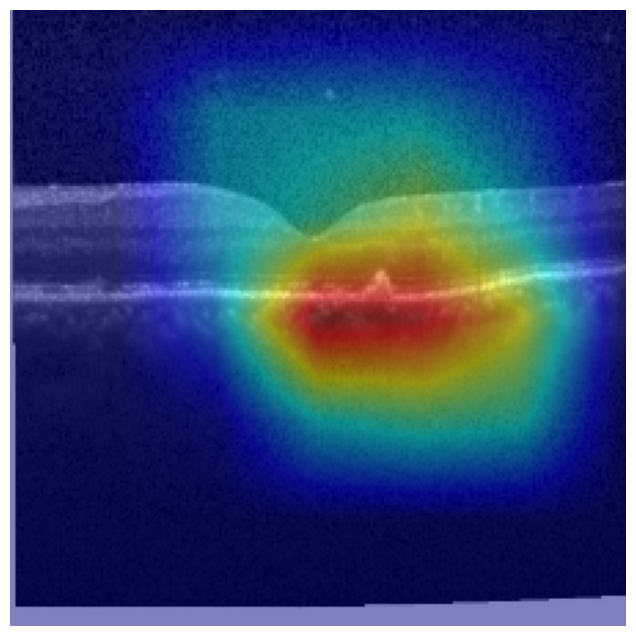

In [259]:
img = cv2.imread(test_img_path, 1)
img = np.float32(cv2.resize(img, (224, 224))) / 255
input = preprocess_image(img)
    
for i in range(1,4):
    if i != 3:
        grad_cam = GradCam(model=mobilenetv2_test.mobilenet_v2, module1='features', module2 =str(i*6), module3 = 'conv', layer='2')
    elif i == 3:
        grad_cam = GradCam(model=mobilenetv2_test, module1='mobilenet_v2', module2 ='features', module3 = '18', layer='0')
    mask = grad_cam(input, None)
    heatmap = cv2.applyColorMap(np.uint8(255 * mask), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam = heatmap + np.float32(img)
    cam = cam / np.max(cam)
    imgRGB = cv2.cvtColor(cam, cv2.COLOR_BGR2RGB)
    plt.axis('off') # 창에있는 x축 y축 제거
    plt.imshow(imgRGB)
    plt.savefig(os.path.join(saved_loc, f'Layer{6*i}.jpg'), format='jpeg')
    plt.show()

- ##### Main visualization

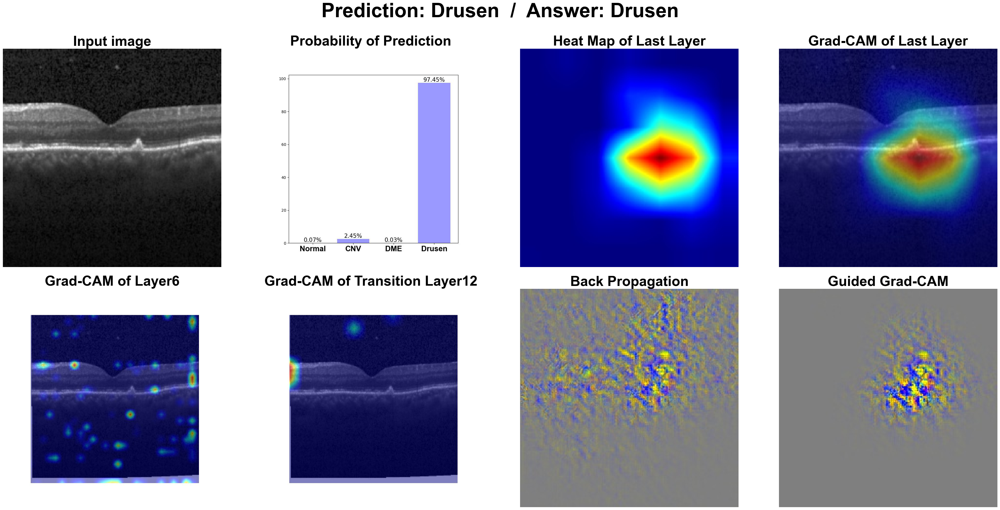

In [260]:
# Main
fig, subplot = plt.subplots(2,4,figsize=(40,20))
plt.subplots_adjust(left=0.05, right=0.95, bottom=0.1, top=0.9, wspace=0.01, hspace=0.1)
suptitle_fontdict={'fontname': 'Arial','fontsize': 50, 'fontweight': 'bold'}
fig.suptitle(f'Prediction: {idx2label[pred]}  /  Answer: {label}', **suptitle_fontdict)

# Input image
pil_img = Image.open(test_img_path)
pil_transform = transforms.Compose([
            transforms.Resize([256]),
            transforms.CenterCrop(224),
        ])

subtitle_fontdict={'fontname': 'Arial','fontsize': 35, 'fontweight': 'bold'}
subplot[0,0].imshow(pil_transform(pil_img), cmap='gray')
subplot[0,0].set_title('Input image', **subtitle_fontdict)
subplot[0,0].axis('off')

# Bar chart
bar_chart = Image.open(os.path.join(saved_loc, "Prediction_bar_chart.jpg"))
subplot[0,1].imshow(bar_chart)
subplot[0,1].set_title('Probability of Prediction', **subtitle_fontdict)
subplot[0,1].axis('off')

# Grad-CAM Heat map
G_heatmap = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_CAM_heatmap.jpg")), cv2.COLOR_BGR2RGB)
subplot[0,2].imshow(G_heatmap)
subplot[0,2].set_title('Heat Map of Last Layer', **subtitle_fontdict)
subplot[0,2].axis('off')

# GradCAM
G_result = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_Result.jpg")), cv2.COLOR_BGR2RGB)
subplot[0,3].imshow(G_result)
subplot[0,3].set_title('Grad-CAM of Last Layer', **subtitle_fontdict)
subplot[0,3].axis('off')


# Grad-CAM of early layer
G_result_10= cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Layer6.jpg")), cv2.COLOR_BGR2RGB)
subplot[1,0].imshow(G_result_10)
subplot[1,0].set_title('Grad-CAM of Layer6', **subtitle_fontdict)
subplot[1,0].axis('off')

G_result_20= cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Layer12.jpg")), cv2.COLOR_BGR2RGB)
subplot[1,1].imshow(G_result_20)
subplot[1,1].set_title('Grad-CAM of Transition Layer12', **subtitle_fontdict)
subplot[1,1].axis('off')


'''G_result = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Grad_Result.jpg")), cv2.COLOR_BGR2RGB)
subplot[2,0].imshow(G_result)
subplot[2,0].set_title('Grad-CAM of 30th Layer (Last Layer)', **subtitle_fontdict)
subplot[2,0].axis('off')'''

# Guided-backprop
G_Back = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Backprop.jpg")), cv2.COLOR_BGR2RGB)
subplot[1,2].imshow(G_Back)
subplot[1,2].set_title('Back Propagation', **subtitle_fontdict)
subplot[1,2].axis('off')

G_CAM = cv2.cvtColor(cv2.imread(os.path.join(saved_loc, "Guided_Grad_CAM.jpg")), cv2.COLOR_BGR2RGB)
subplot[1,3].imshow(G_CAM)
subplot[1,3].set_title('Guided Grad-CAM', **subtitle_fontdict)
subplot[1,3].axis('off')

plt.savefig(os.path.join(saved_loc, "Final_visualization.jpg"), format='jpeg')
plt.show()

### Zip all outcomes

In [ ]:
import shutil
from IPython.display import FileLink
shutil.make_archive('OUTPUT', 'zip', '/kaggle/working/')
FileLink(r'OUTPUT.zip') # 여기에 zip파일 이름 넣기